In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import itertools
import plotly.graph_objects as go

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.model_selection import GridSearchCV, cross_validate
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.impute import KNNImputer
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

import warnings
warnings.simplefilter(action="ignore")

In [2]:
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_rows', 20)
pd.set_option('display.float_format', lambda x: '%.3f' % x)

In [3]:
df = pd.read_csv("data/diabetes.csv")

In [4]:
def check_df(dataframe, head=5):
    print("##################### Shape #####################")
    print(dataframe.shape)
    print("##################### Types #####################")
    print(dataframe.dtypes)
    print("##################### Head #####################")
    print(dataframe.head(head))
    print("##################### Tail #####################")
    print(dataframe.tail(head))
    print("##################### NA #####################")
    print(dataframe.isnull().sum())
    print("##################### Quantiles #####################")
    print(dataframe.quantile([0, 0.05, 0.50, 0.95, 0.99, 1]).T)

check_df(df)

##################### Shape #####################
(768, 9)
##################### Types #####################
Pregnancies                   int64
Glucose                       int64
BloodPressure                 int64
SkinThickness                 int64
Insulin                       int64
BMI                         float64
DiabetesPedigreeFunction    float64
Age                           int64
Outcome                       int64
dtype: object
##################### Head #####################
   Pregnancies  Glucose  BloodPressure  SkinThickness  Insulin    BMI  \
0            6      148             72             35        0 33.600   
1            1       85             66             29        0 26.600   
2            8      183             64              0        0 23.300   
3            1       89             66             23       94 28.100   
4            0      137             40             35      168 43.100   

   DiabetesPedigreeFunction  Age  Outcome  
0                    

In [5]:
def grab_col_names(dataframe, cat_th=10, car_th=20):
    """

    Returns the names of categorical, numeric and categorical but cardinal variables in the data set.
    Note Categorical variables include categorical variables with numeric appearance.

    Parameters
    ------
        dataframe: dataframe
                Variable names of the dataframe to be taken
        cat_th: int, optional
                class threshold for numeric but categorical variables
        car_th: int, optinal
                class threshold for categorical but cardinal variables

    Returns
    ------
        cat_cols: list
                Categorical variable list
        num_cols: list
                Numeric variable list
        cat_but_car: list
                List of cardinal variables with categorical appearance

    Examples
    ------
        import seaborn as sns
        df = sns.load_dataset("iris")
        print(grab_col_names(df))


    Notes
    ------
        cat_cols + num_cols + cat_but_car = total number of variables
        num_but_cat is inside cat_cols.
        The sum of the 3 return lists equals the total number of variables: cat_cols + num_cols + cat_but_car = number of variables

    """

    # cat_cols, cat_but_car
    cat_cols = [col for col in dataframe.columns if dataframe[col].dtypes == "O"] 

    num_but_cat = [col for col in dataframe.columns if dataframe[col].nunique() < cat_th and
                   dataframe[col].dtypes != "O"]

    cat_but_car = [col for col in dataframe.columns if dataframe[col].nunique() > car_th and
                   dataframe[col].dtypes == "O"]

    cat_cols = cat_cols + num_but_cat

    cat_cols = [col for col in cat_cols if col not in cat_but_car] 

    num_cols = [col for col in dataframe.columns if dataframe[col].dtypes != "O"] 

    num_cols = [col for col in num_cols if col not in num_but_cat] 
    
    print(f"Observations: {dataframe.shape[0]}") 
    print(f"Variables: {dataframe.shape[1]}") 
    print(f'cat_cols: {len(cat_cols)}') 
    print(f'num_cols: {len(num_cols)}') 
    print(f'cat_but_car: {len(cat_but_car)}') 
    print(f'num_but_cat: {len(num_but_cat)}') 


    return cat_cols, num_cols, cat_but_car, num_but_cat


In [6]:
cat_cols, num_cols, cat_but_car,  num_but_cat = grab_col_names(df)

Observations: 768
Variables: 9
cat_cols: 1
num_cols: 8
cat_but_car: 0
num_but_cat: 1


In [7]:
cat_cols

['Outcome']

In [8]:
num_cols

['Pregnancies',
 'Glucose',
 'BloodPressure',
 'SkinThickness',
 'Insulin',
 'BMI',
 'DiabetesPedigreeFunction',
 'Age']

In [9]:
cat_but_car

[]

In [10]:
num_but_cat

['Outcome']

In [11]:
def cat_summary(dataframe, col_name, plot=False):
    print(pd.DataFrame({col_name: dataframe[col_name].value_counts(),
                        "Ratio": 100 * dataframe[col_name].value_counts() / len(dataframe)}))
    print("##########################################")
    if plot:
        sns.countplot(x=dataframe[col_name], data=dataframe)
        plt.show(block=True)


         Outcome  Ratio
Outcome                
0            500 65.104
1            268 34.896
##########################################


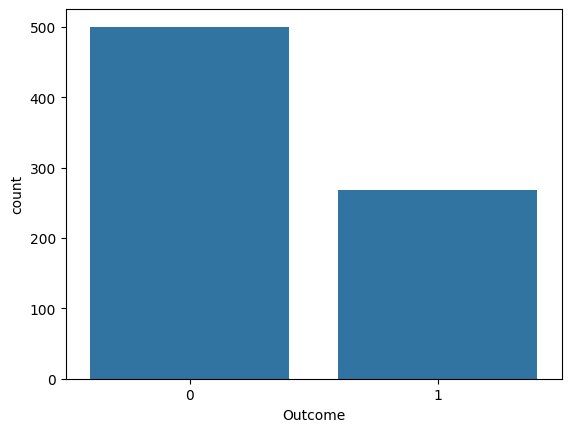

In [12]:
# We did it this way because there is only one categorical variable.

cat_summary(df, "Outcome", plot=True)

         Outcome  Ratio
Outcome                
0            500 65.104
1            268 34.896
##########################################


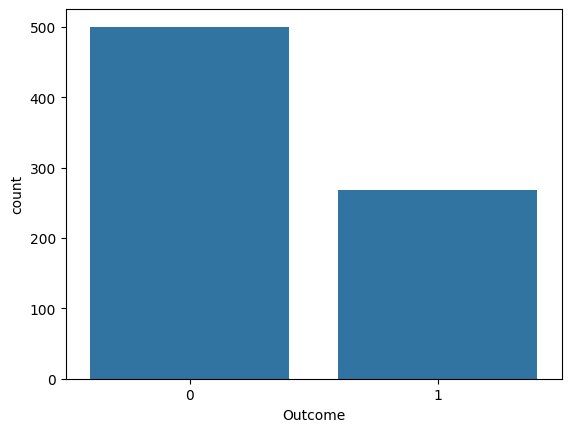

In [13]:
# If there were more than one categorical variable, we would loop through all categorical variables one by one as follows to run the function.

for col in cat_cols:
    cat_summary(df, col, plot=True)

In [14]:
def num_summary(dataframe, numerical_col, plot=False):
    quantiles = [0.05, 0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 0.95, 0.99]
    print(dataframe[numerical_col].describe(quantiles).T)

    if plot:
        dataframe[numerical_col].hist(bins=20)
        plt.xlabel(numerical_col)
        plt.title(numerical_col)
        plt.show(block=True)

count   768.000
mean      3.845
std       3.370
min       0.000
5%        0.000
10%       0.000
20%       1.000
30%       1.000
40%       2.000
50%       3.000
60%       4.000
70%       5.000
80%       7.000
90%       9.000
95%      10.000
99%      13.000
max      17.000
Name: Pregnancies, dtype: float64


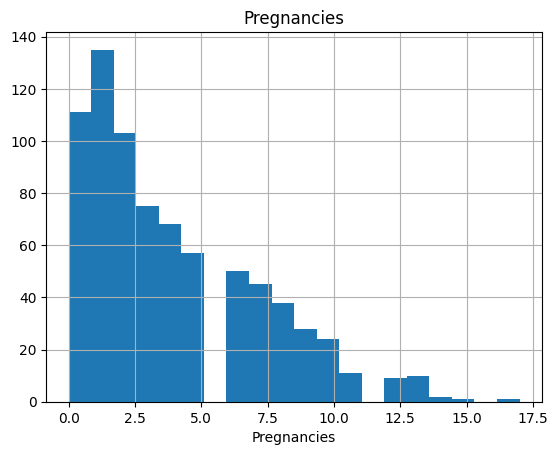

count   768.000
mean    120.895
std      31.973
min       0.000
5%       79.000
10%      85.000
20%      95.000
30%     102.000
40%     109.000
50%     117.000
60%     125.000
70%     134.000
80%     147.000
90%     167.000
95%     181.000
99%     196.000
max     199.000
Name: Glucose, dtype: float64


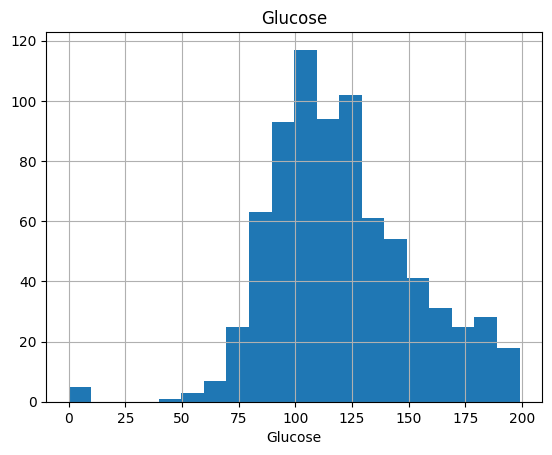

count   768.000
mean     69.105
std      19.356
min       0.000
5%       38.700
10%      54.000
20%      60.000
30%      64.000
40%      68.000
50%      72.000
60%      74.000
70%      78.000
80%      82.000
90%      88.000
95%      90.000
99%     106.000
max     122.000
Name: BloodPressure, dtype: float64


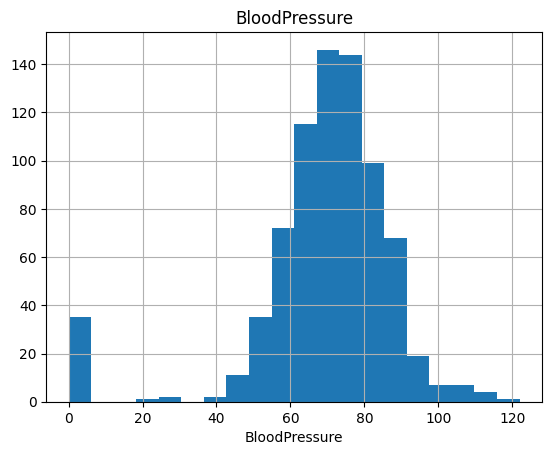

count   768.000
mean     20.536
std      15.952
min       0.000
5%        0.000
10%       0.000
20%       0.000
30%       8.200
40%      18.000
50%      23.000
60%      27.000
70%      31.000
80%      35.000
90%      40.000
95%      44.000
99%      51.330
max      99.000
Name: SkinThickness, dtype: float64


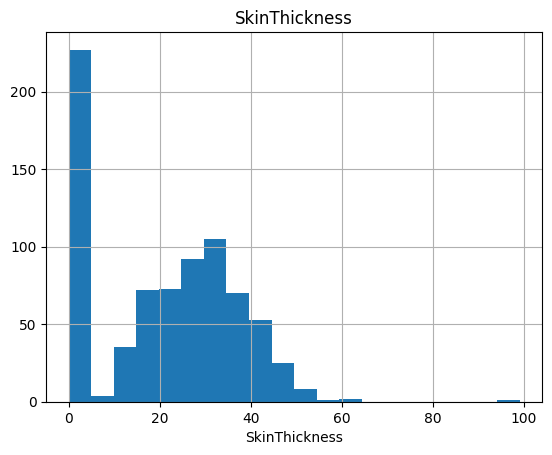

count   768.000
mean     79.799
std     115.244
min       0.000
5%        0.000
10%       0.000
20%       0.000
30%       0.000
40%       0.000
50%      30.500
60%      72.200
70%     106.000
80%     150.000
90%     210.000
95%     293.000
99%     519.900
max     846.000
Name: Insulin, dtype: float64


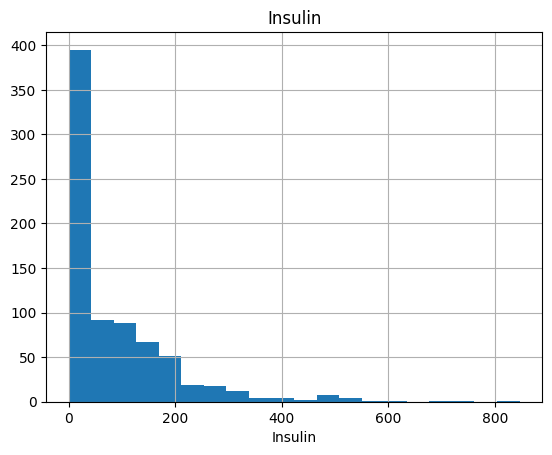

count   768.000
mean     31.993
std       7.884
min       0.000
5%       21.800
10%      23.600
20%      25.900
30%      28.200
40%      30.100
50%      32.000
60%      33.700
70%      35.490
80%      37.800
90%      41.500
95%      44.395
99%      50.759
max      67.100
Name: BMI, dtype: float64


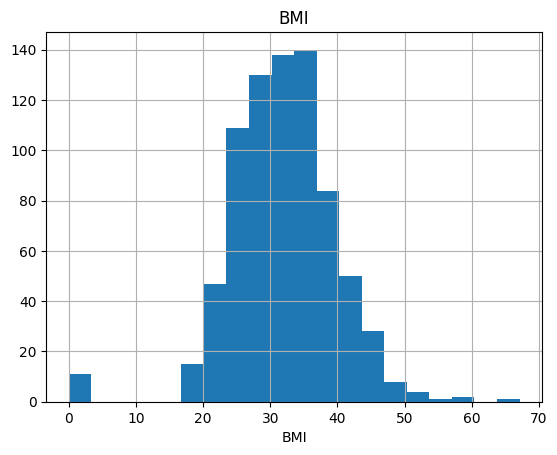

count   768.000
mean      0.472
std       0.331
min       0.078
5%        0.140
10%       0.165
20%       0.219
30%       0.259
40%       0.303
50%       0.372
60%       0.454
70%       0.564
80%       0.687
90%       0.879
95%       1.133
99%       1.698
max       2.420
Name: DiabetesPedigreeFunction, dtype: float64


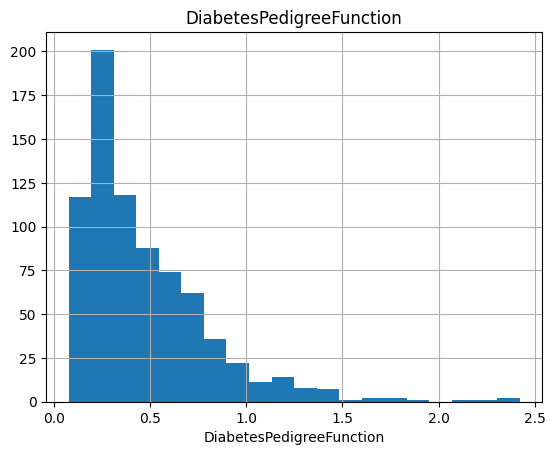

count   768.000
mean     33.241
std      11.760
min      21.000
5%       21.000
10%      22.000
20%      23.000
30%      25.000
40%      27.000
50%      29.000
60%      33.000
70%      38.000
80%      42.600
90%      51.000
95%      58.000
99%      67.000
max      81.000
Name: Age, dtype: float64


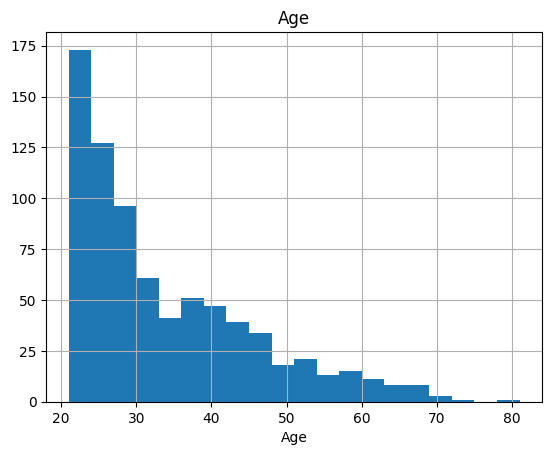

In [15]:
for col in num_cols:
    num_summary(df, col, plot=True)

In [16]:
def target_summary_with_cat(dataframe, target, categorical_col, plot=False):
    print(pd.DataFrame({'TARGET_MEAN': dataframe.groupby(categorical_col)[target].mean()}), end='\n\n\n')
    if plot:
        sns.barplot(x=categorical_col, y=target, data=dataframe)
        plt.show(block=True)

         TARGET_MEAN
Outcome             
0              0.000
1              1.000




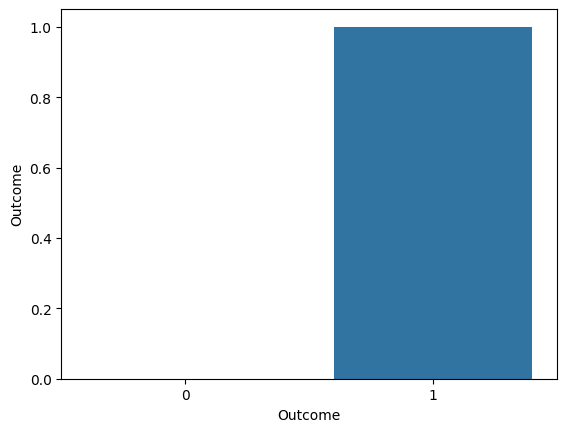

In [17]:
for col in cat_cols:
    target_summary_with_cat(df, "Outcome", col, plot=True)

In [18]:
def target_summary_with_num(dataframe, target, numerical_col, plot=False):
    print(pd.DataFrame({numerical_col+'_mean': dataframe.groupby(target)[numerical_col].mean()}), end='\n\n\n')
    if plot:
        sns.barplot(x=target, y=numerical_col, data=dataframe)
        plt.show(block=True)

         Pregnancies_mean
Outcome                  
0                   3.298
1                   4.866




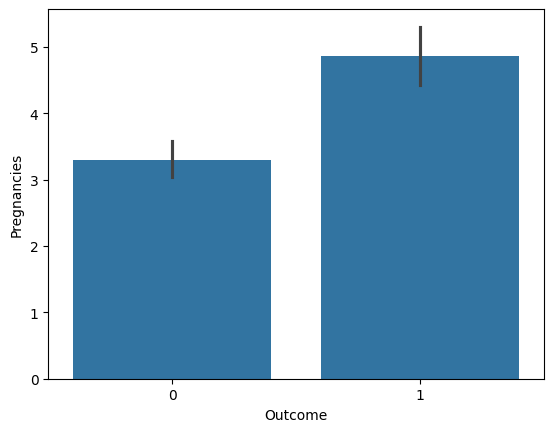

         Glucose_mean
Outcome              
0             109.980
1             141.257




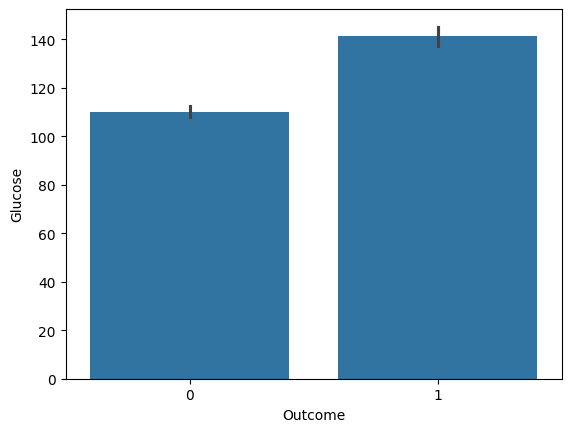

         BloodPressure_mean
Outcome                    
0                    68.184
1                    70.825




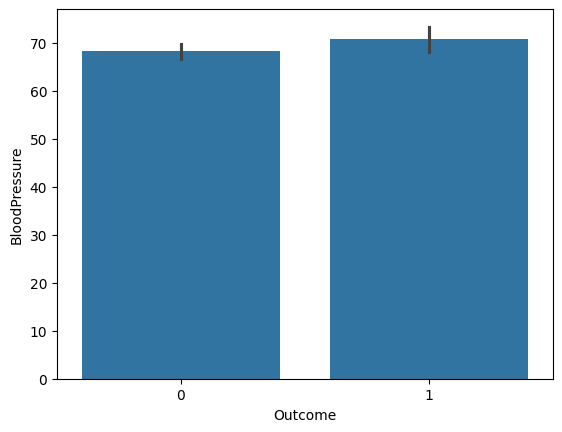

         SkinThickness_mean
Outcome                    
0                    19.664
1                    22.164




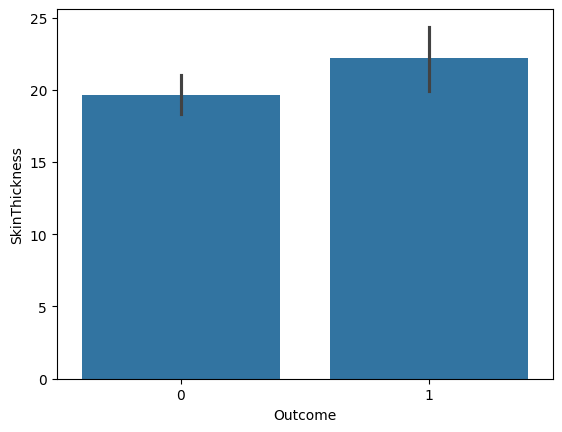

         Insulin_mean
Outcome              
0              68.792
1             100.336




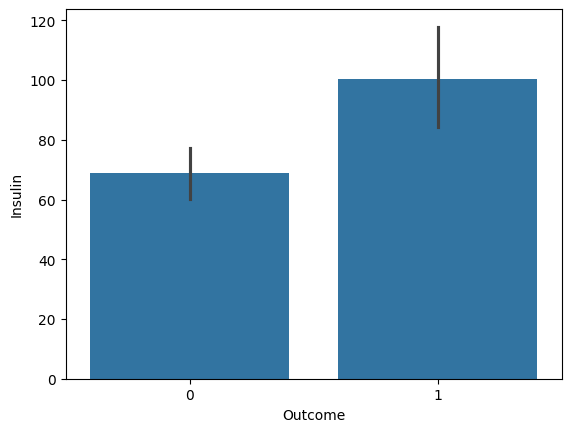

         BMI_mean
Outcome          
0          30.304
1          35.143




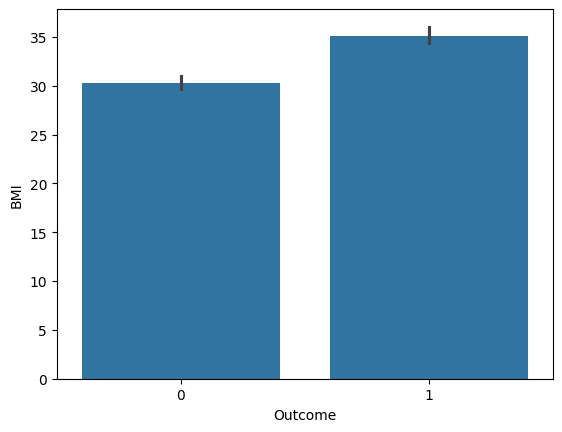

         DiabetesPedigreeFunction_mean
Outcome                               
0                                0.430
1                                0.550




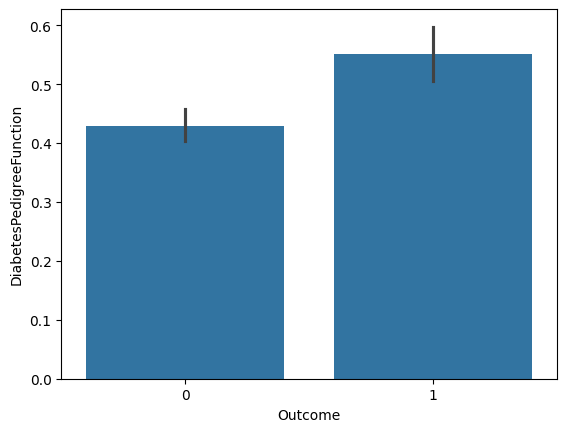

         Age_mean
Outcome          
0          31.190
1          37.067




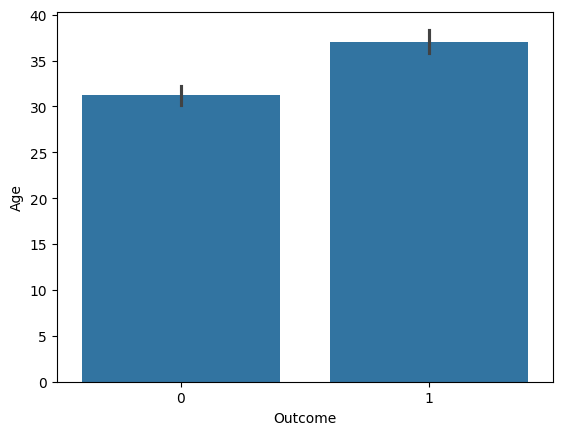

In [19]:
for col in num_cols:
    target_summary_with_num(df, "Outcome", col, plot=True)

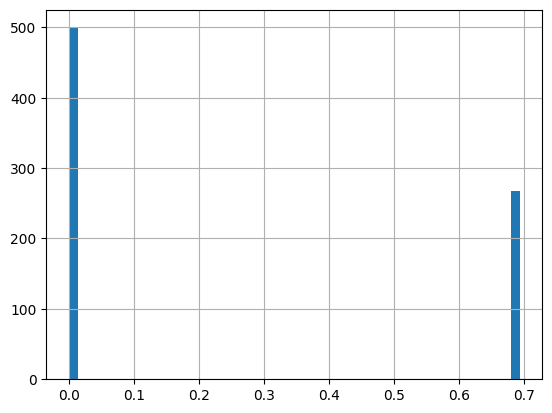

In [20]:
np.log1p(df["Outcome"]).hist(bins=50)
plt.show(block=True)

In [21]:
corr = df[num_cols].corr()

In [22]:
corr

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
Pregnancies,1.000,0.129,0.141,-0.082,-0.074,0.018,-0.034,0.544
Glucose,0.129,1.000,0.153,0.057,0.331,0.221,0.137,0.264
BloodPressure,0.141,0.153,1.000,0.207,0.089,0.282,0.041,0.240
SkinThickness,-0.082,0.057,0.207,1.000,0.437,0.393,0.184,-0.114
Insulin,-0.074,0.331,0.089,0.437,1.000,0.198,0.185,-0.042
BMI,0.018,0.221,0.282,0.393,0.198,1.000,0.141,0.036
DiabetesPedigreeFunction,-0.034,0.137,0.041,0.184,0.185,0.141,1.000,0.034
Age,0.544,0.264,0.240,-0.114,-0.042,0.036,0.034,1.000


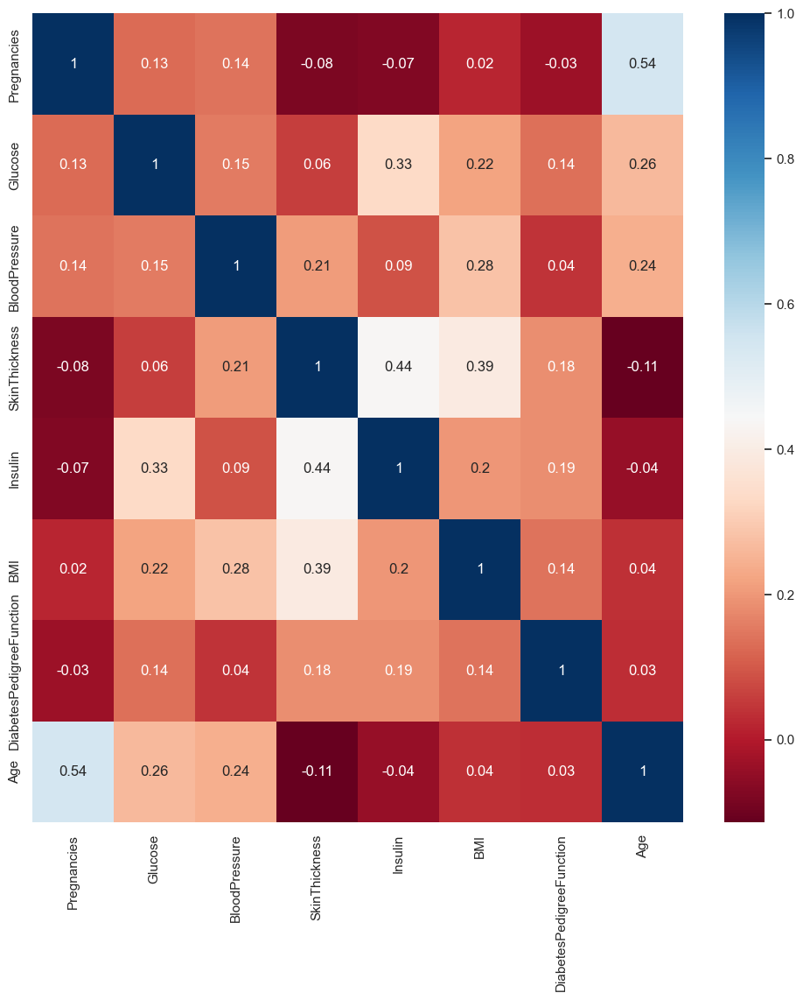

In [23]:
# Correlation heatmap without using functions

sns.set(rc={"figure.figsize": (12, 12)})
corr_values = corr.round(2)
sns.heatmap(corr, cmap="RdBu", annot=corr_values)
plt.show(block=True)

In [24]:
def high_correlated_cols(dataframe, plot=False, corr_th=0.70):
    corr = dataframe.corr()
    cor_matrix = corr.abs()
    upper_triangle_matrix = cor_matrix.where(np.triu(np.ones(cor_matrix.shape), k=1).astype(bool))
    drop_list = [col for col in upper_triangle_matrix.columns if any(upper_triangle_matrix[col] > corr_th)]
    if plot:
        import seaborn as sns
        import matplotlib.pyplot as plt
        sns.set(rc={"figure.figsize": (12, 12)})
        corr_values = corr.round(2)
        sns.heatmap(corr, cmap="RdBu", annot=corr_values)
        plt.show(block=True)
    return drop_list

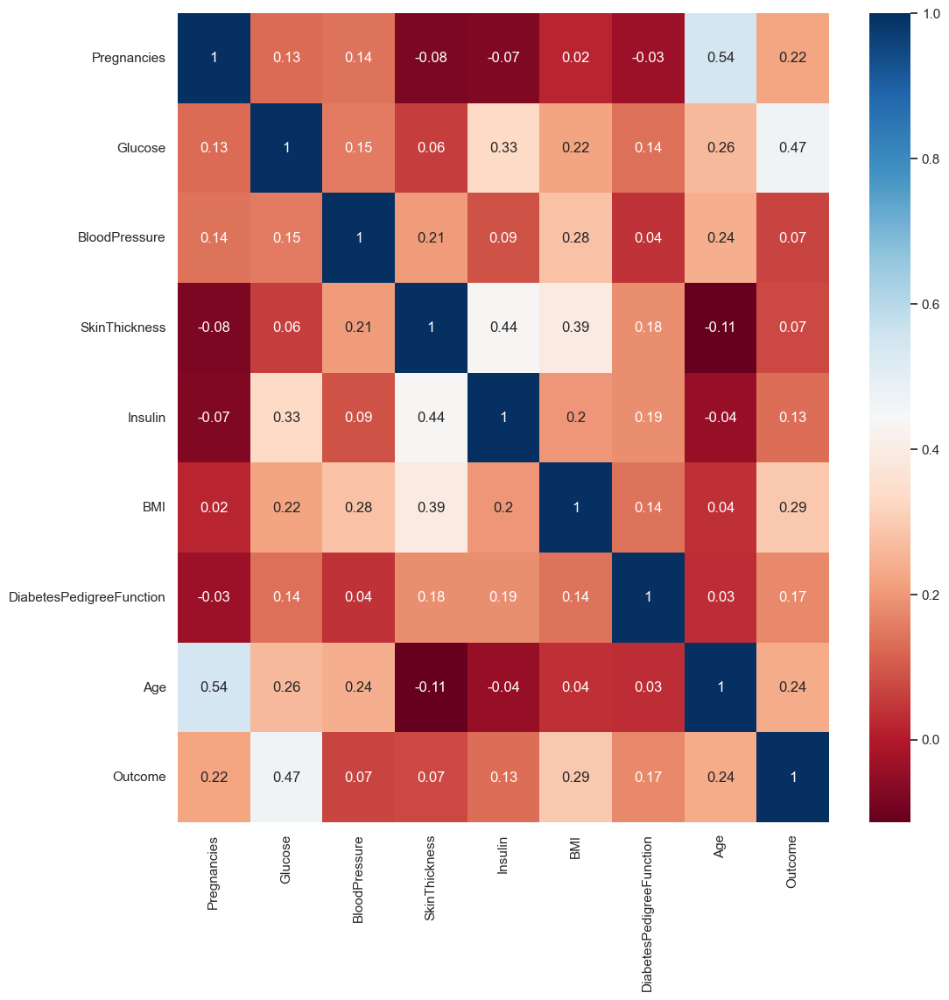

[]

In [25]:
high_correlated_cols(df, plot=True)

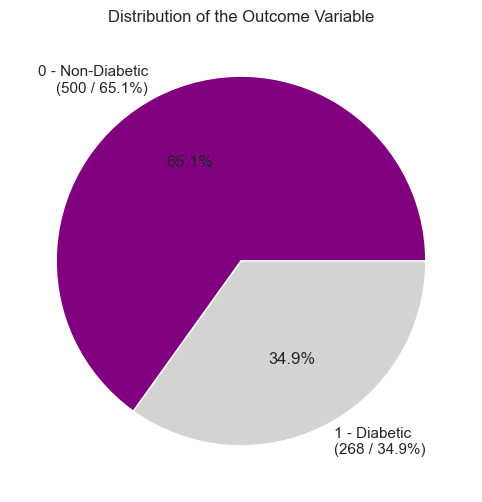

In [26]:
# Calculate the counts of each outcome
outcome_counts = df['Outcome'].value_counts()

# Calculate the total number of patients
total_patients = outcome_counts.sum()

# Calculate the percentages
percentages = outcome_counts / total_patients * 100

# Create labels with both quantity and percentage
labels = [f'0 - Non-Diabetic\n({outcome_counts[0]} / {percentages[0]:.1f}%)',
          f'1 - Diabetic\n({outcome_counts[1]} / {percentages[1]:.1f}%)']

# Plot the pie chart with labels and percentages
plt.figure(figsize=(8, 6))
plt.pie(outcome_counts, labels=labels, autopct='%1.1f%%', colors=['purple', 'lightgray'])
plt.title('Distribution of the Outcome Variable')
plt.show()

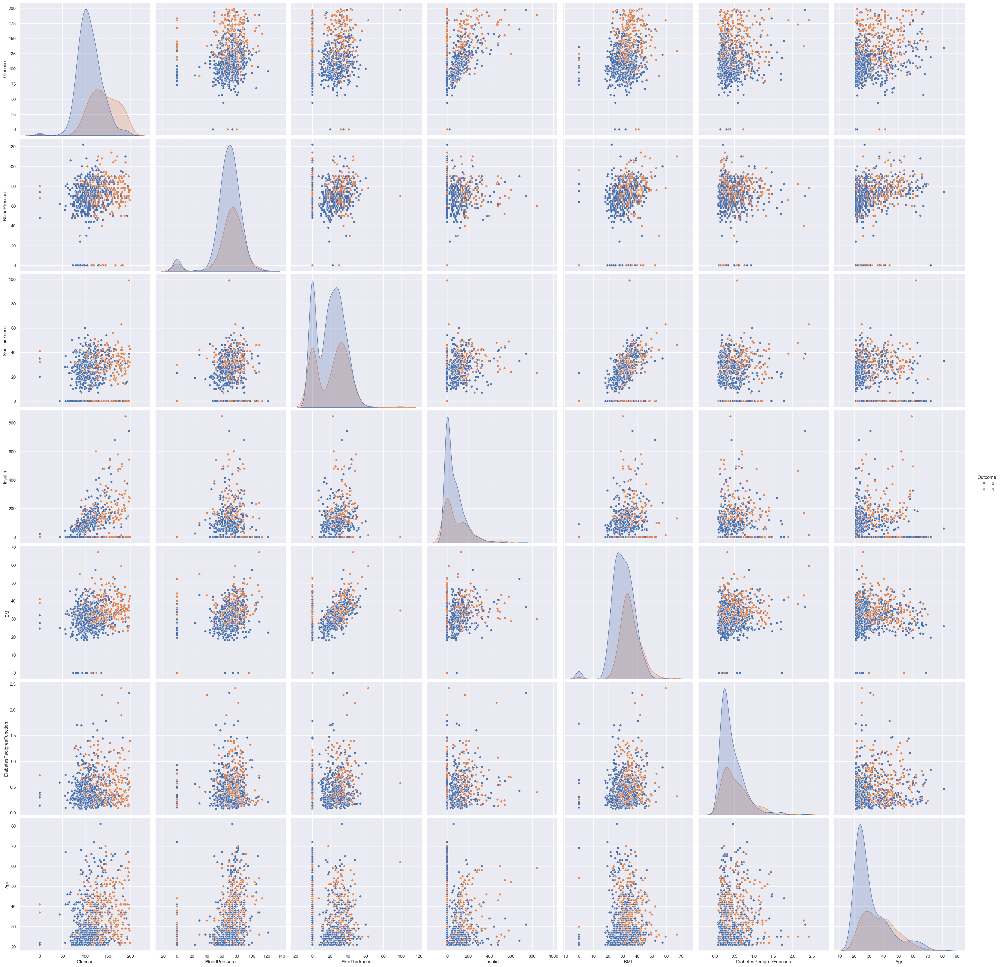

In [27]:
sns.pairplot(data=df, vars=['Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age'], hue='Outcome', height=5)
plt.show(block=True)

In [28]:
# Create combinations of binary categorical variables
feature_combinations = list(itertools.combinations(['Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age'], 2))

# Create a separate Bubble Chart for each binary categorical variable
for i, (feature1, feature2) in enumerate(feature_combinations):
    fig = px.scatter(df, x=feature1, y=feature2, color='Outcome', size='BMI',
                     title=f'{feature1} vs {feature2} Bubble Chart')

    fig.show(block=True)

In [29]:
# Creating the Dependent Variable.

y = df["Outcome"]

# Creating Independent Variables.

X = df.drop("Outcome", axis=1)

# Splitting the Data into Training and Test Sets

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=17)


In [30]:
# Random Forest Classifier Model Training

rf_model = RandomForestClassifier(random_state=46).fit(X_train, y_train)

# Prediction using Random Forest Classifier Model

y_pred = rf_model.predict(X_test)

print("RandomForestClassifier:")
print(f"Accuracy: {round(accuracy_score(y_pred, y_test), 4)}")
print(f"Recall: {round(recall_score(y_pred,y_test),4)}")
print(f"Precision: {round(precision_score(y_pred,y_test), 4)}")
print(f"F1: {round(f1_score(y_pred,y_test), 4)}")
print(f"Auc: {round(roc_auc_score(y_pred,y_test), 4)}")

RandomForestClassifier:
Accuracy: 0.7706
Recall: 0.7059
Precision: 0.5926
F1: 0.6443
Auc: 0.7517


In [31]:
lr_model = LogisticRegression()
lr_model.fit(X_train, y_train)
lr_pred = lr_model.predict(X_test)

print("Logistic Regression:")
print(f"Accuracy: {round(accuracy_score(lr_pred, y_test), 4)}")
print(f"Recall: {round(recall_score(lr_pred, y_test), 4)}")
print(f"Precision: {round(precision_score(lr_pred, y_test), 4)}")
print(f"F1: {round(f1_score(lr_pred, y_test), 4)}")
print(f"AUC: {round(roc_auc_score(lr_pred, y_test), 4)}")

Logistic Regression:
Accuracy: 0.7879
Recall: 0.7667
Precision: 0.5679
F1: 0.6525
AUC: 0.781


In [32]:
knn_model = KNeighborsClassifier()
knn_model.fit(X_train, y_train)
knn_pred = knn_model.predict(X_test)

print("K-Nearest Neighbors (KNN):")
print(f"Accuracy: {round(accuracy_score(knn_pred, y_test), 4)}")
print(f"Recall: {round(recall_score(knn_pred, y_test), 4)}")
print(f"Precision: {round(precision_score(knn_pred, y_test), 4)}")
print(f"F1: {round(f1_score(knn_pred, y_test), 4)}")
print(f"AUC: {round(roc_auc_score(knn_pred, y_test), 4)}")


K-Nearest Neighbors (KNN):
Accuracy: 0.7619
Recall: 0.6711
Precision: 0.6296
F1: 0.6497
AUC: 0.7388


In [33]:
svc_model = SVC()
svc_model.fit(X_train, y_train)
svc_pred = svc_model.predict(X_test)

print("Support Vector Classifier (SVC):")
print(f"Accuracy: {round(accuracy_score(svc_pred, y_test), 4)}")
print(f"Recall: {round(recall_score(svc_pred, y_test), 4)}")
print(f"Precision: {round(precision_score(svc_pred, y_test), 4)}")
print(f"F1: {round(f1_score(svc_pred, y_test), 4)}")
print(f"AUC: {round(roc_auc_score(svc_pred, y_test), 4)}")

Support Vector Classifier (SVC):
Accuracy: 0.7446
Recall: 0.6833
Precision: 0.5062
F1: 0.5816
AUC: 0.7247


In [34]:
dt_model = DecisionTreeClassifier()
dt_model.fit(X_train, y_train)
dt_pred = dt_model.predict(X_test)

print("Decision Tree Classifier:")
print(f"Accuracy: {round(accuracy_score(dt_pred, y_test), 4)}")
print(f"Recall: {round(recall_score(dt_pred, y_test), 4)}")
print(f"Precision: {round(precision_score(dt_pred, y_test), 4)}")
print(f"F1: {round(f1_score(dt_pred, y_test), 4)}")
print(f"AUC: {round(roc_auc_score(dt_pred, y_test), 4)}")

Decision Tree Classifier:
Accuracy: 0.7273
Recall: 0.6154
Precision: 0.5926
F1: 0.6038
AUC: 0.6998


In [35]:
ada_model = AdaBoostClassifier()
ada_model.fit(X_train, y_train)
ada_pred = ada_model.predict(X_test)

print("AdaBoost Classifier:")
print(f"Accuracy: {round(accuracy_score(ada_pred, y_test), 4)}")
print(f"Recall: {round(recall_score(ada_pred, y_test), 4)}")
print(f"Precision: {round(precision_score(ada_pred, y_test), 4)}")
print(f"F1: {round(f1_score(ada_pred, y_test), 4)}")
print(f"AUC: {round(roc_auc_score(ada_pred, y_test), 4)}")

AdaBoost Classifier:
Accuracy: 0.7532
Recall: 0.6765
Precision: 0.5679
F1: 0.6174
AUC: 0.7309


In [36]:
gb_model = GradientBoostingClassifier()
gb_model.fit(X_train, y_train)
gb_pred = gb_model.predict(X_test)

print("Gradient Boosting Classifier:")
print(f"Accuracy: {round(accuracy_score(gb_pred, y_test), 4)}")
print(f"Recall: {round(recall_score(gb_pred, y_test), 4)}")
print(f"Precision: {round(precision_score(gb_pred, y_test), 4)}")
print(f"F1: {round(f1_score(gb_pred, y_test), 4)}")
print(f"AUC: {round(roc_auc_score(gb_pred, y_test), 4)}")

Gradient Boosting Classifier:
Accuracy: 0.7706
Recall: 0.6892
Precision: 0.6296
F1: 0.6581
AUC: 0.7491


In [37]:
xgb_model = XGBClassifier()
xgb_model.fit(X_train, y_train)
xgb_pred = xgb_model.predict(X_test)

print("XGBoost Classifier:")
print(f"Accuracy: {round(accuracy_score(xgb_pred, y_test), 4)}")
print(f"Recall: {round(recall_score(xgb_pred, y_test), 4)}")
print(f"Precision: {round(precision_score(xgb_pred, y_test), 4)}")
print(f"F1: {round(f1_score(xgb_pred, y_test), 4)}")
print(f"AUC: {round(roc_auc_score(xgb_pred, y_test), 4)}")

XGBoost Classifier:
Accuracy: 0.7619
Recall: 0.6806
Precision: 0.6049
F1: 0.6405
AUC: 0.7396


In [38]:
lgbm_model = LGBMClassifier()
lgbm_model.fit(X_train, y_train)
lgbm_pred = lgbm_model.predict(X_test)

print("LightGBM Classifier:")
print(f"Accuracy: {round(accuracy_score(lgbm_pred, y_test), 4)}")
print(f"Recall: {round(recall_score(lgbm_pred, y_test), 4)}")
print(f"Precision: {round(precision_score(lgbm_pred, y_test), 4)}")
print(f"F1: {round(f1_score(lgbm_pred, y_test), 4)}")
print(f"AUC: {round(roc_auc_score(lgbm_pred, y_test), 4)}")

[LightGBM] [Info] Number of positive: 187, number of negative: 350
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000222 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 618
[LightGBM] [Info] Number of data points in the train set: 537, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.348231 -> initscore=-0.626825
[LightGBM] [Info] Start training from score -0.626825
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

In [39]:
# Dictionary containing the metric results
metrics = {
    "Model": ["Random Forest", "Logistic Regression", "KNN", "SVC", "Decision Tree", "AdaBoost", "Gradient Boosting", "XGBoost", "LightGBM"],
    "Accuracy": [0.7706, 0.7879, 0.7619, 0.7446, 0.7186, 0.7532, 0.7706, 0.7706, 0.7619],
    "Recall": [0.7059, 0.7667, 0.6711, 0.6833, 0.6053, 0.6765, 0.7, 0.7059, 0.6857],
    "Precision": [0.5926, 0.5679, 0.6296, 0.5062, 0.5679, 0.5679, 0.6049, 0.5926, 0.5926],
    "F1": [0.6443, 0.6525, 0.6497, 0.5816, 0.586, 0.6174, 0.649, 0.6443, 0.6358],
    "AUC": [0.7517, 0.781, 0.7388, 0.7247, 0.6897, 0.7309, 0.7506, 0.7517, 0.7404]
}

# Creating a DataFrame from the metrics dictionary
results_df = pd.DataFrame(metrics)

# Sorting the DataFrame by accuracy in descending order
results_df = results_df.sort_values(by="Accuracy", ascending=False)

# Creating the figure for the graph
fig = go.Figure()

# Colors for the metrics
colors = ["purple", "green", "blue", "orange", "red"]

# Adding traces for each metric in the specified order
for metric, color in zip(["Accuracy", "Recall", "Precision", "F1", "AUC"], colors):
    fig.add_trace(go.Bar(
        x=results_df["Model"],
        y=results_df[metric],
        marker_color=color,
        name=metric,
        text=results_df[metric],
        textposition='auto'
    ))

# Setting axis labels and title
fig.update_layout(
    xaxis_title="Model",
    yaxis_title="Metric Score",
    title="Comparison of Metrics for Different Models"
)

# Displaying the graph
fig.show(block=True)

|--- feature_1 <= 129.50
|   |--- feature_5 <= 26.30
|   |   |--- feature_5 <= 9.10
|   |   |   |--- class: 0
|   |   |--- feature_5 >  9.10
|   |   |   |--- class: 0
|   |--- feature_5 >  26.30
|   |   |--- feature_7 <= 27.50
|   |   |   |--- class: 0
|   |   |--- feature_7 >  27.50
|   |   |   |--- class: 0
|--- feature_1 >  129.50
|   |--- feature_5 <= 27.85
|   |   |--- feature_1 <= 145.50
|   |   |   |--- class: 0
|   |   |--- feature_1 >  145.50
|   |   |   |--- class: 0
|   |--- feature_5 >  27.85
|   |   |--- feature_1 <= 158.50
|   |   |   |--- class: 1
|   |   |--- feature_1 >  158.50
|   |   |   |--- class: 1



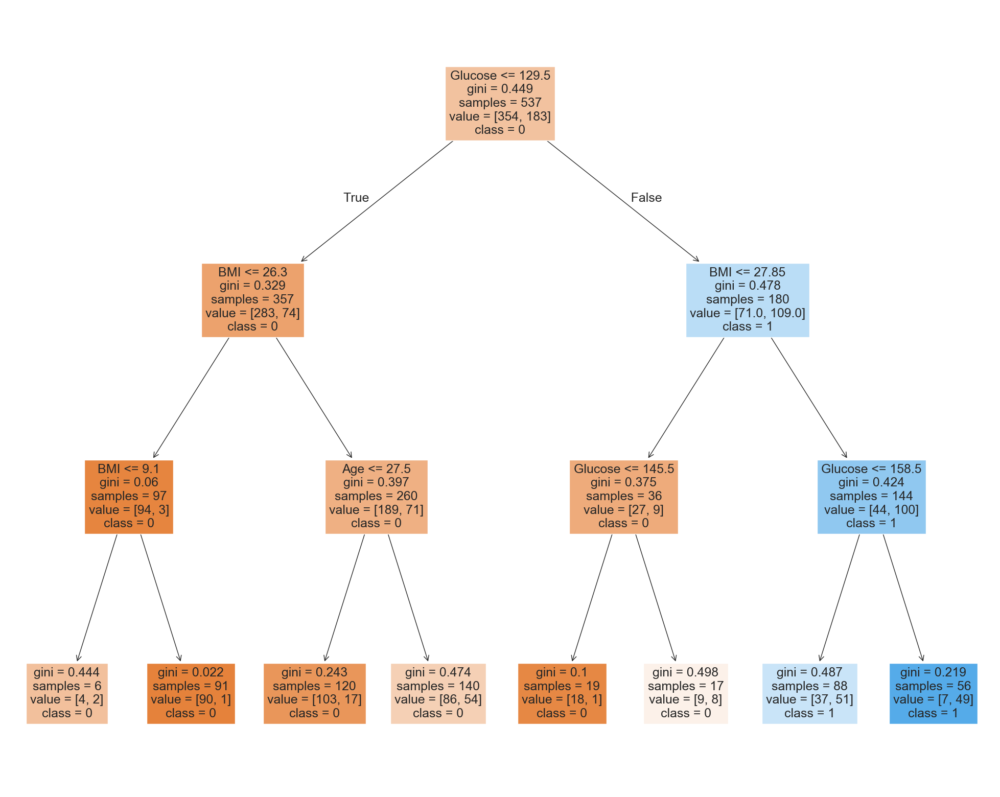

In [40]:
# Loading the dataset and setting the features and target variable
x = pd.DataFrame(df, columns=['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age'])
y = df.Outcome.values.reshape(-1, 1)

# Splitting the data into training and test sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=1)

# Defining and training the Decision Tree Classifier
clf = DecisionTreeClassifier(max_depth=3)
clf = clf.fit(x_train, y_train)

# Making predictions on the test set
y_pred = clf.predict(x_test)

# Generating the text representation of the decision tree and printing it
text_representation = tree.export_text(clf)
print(text_representation)

# Setting the feature and target class names
feature_names = ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']
target_names = ['0', '1']

# Generating and saving the visualization of the decision tree
fig = plt.figure(figsize=(25, 20))
plot = tree.plot_tree(clf, feature_names=feature_names, class_names=target_names, filled=True)
fig.savefig('tree1.png')


In [41]:
def plot_importance(model, features, num=len(X), save=False):
    feature_imp = pd.DataFrame({'Value': model.feature_importances_, 'Feature': features.columns})
    plt.figure(figsize=(10, 10))
    sns.set(font_scale=1)
    sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", ascending=False)[0:num])
    plt.title(f'Feature Importance - {model.__class__.__name__}')
    plt.tight_layout()
    plt.show(block=True)
    if save:
        plt.savefig('importances.png')

In [42]:
model_name = [rf_model, dt_model, xgb_model, lgbm_model]

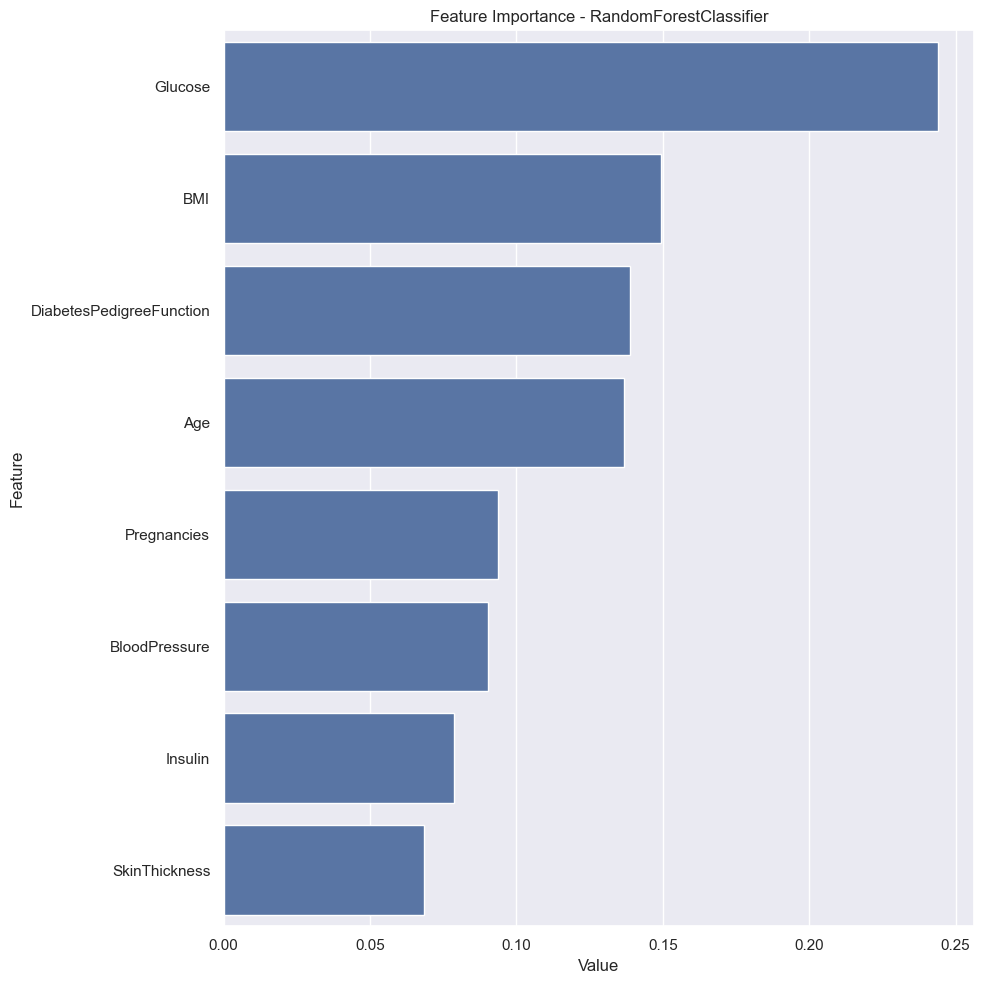

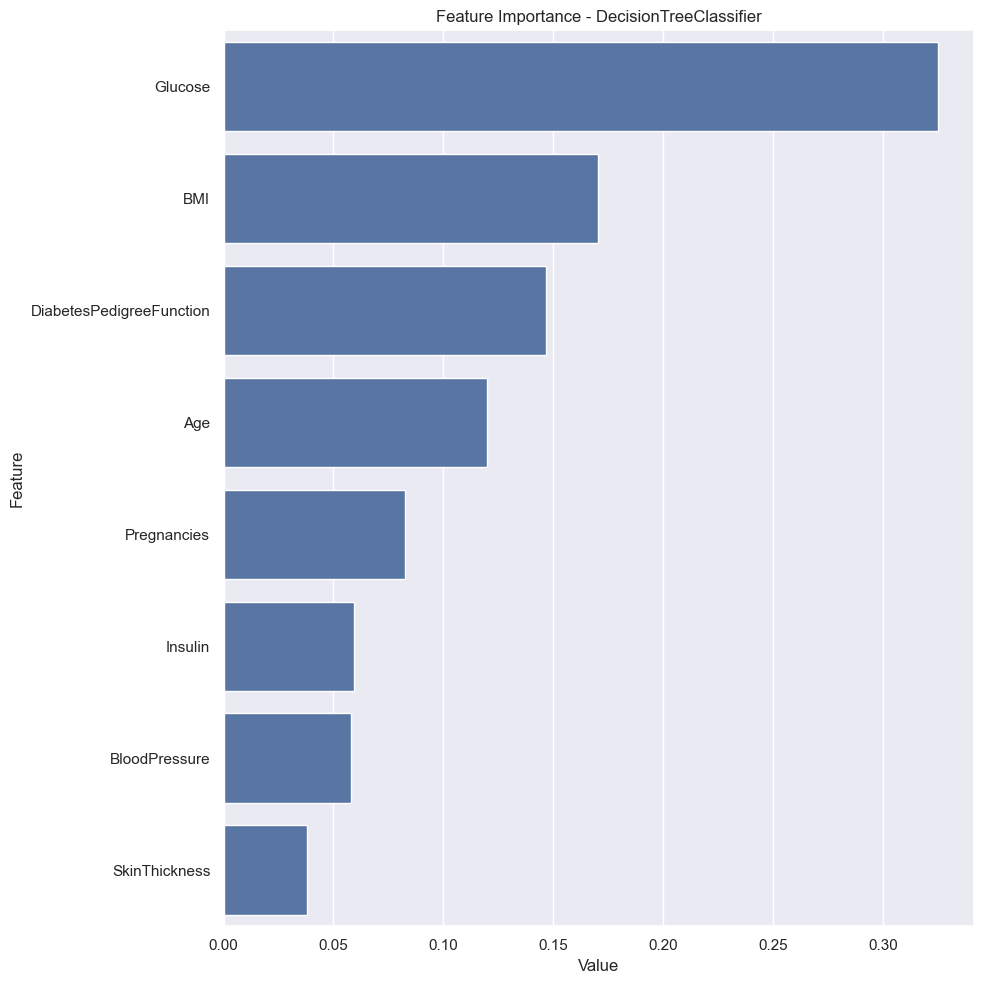

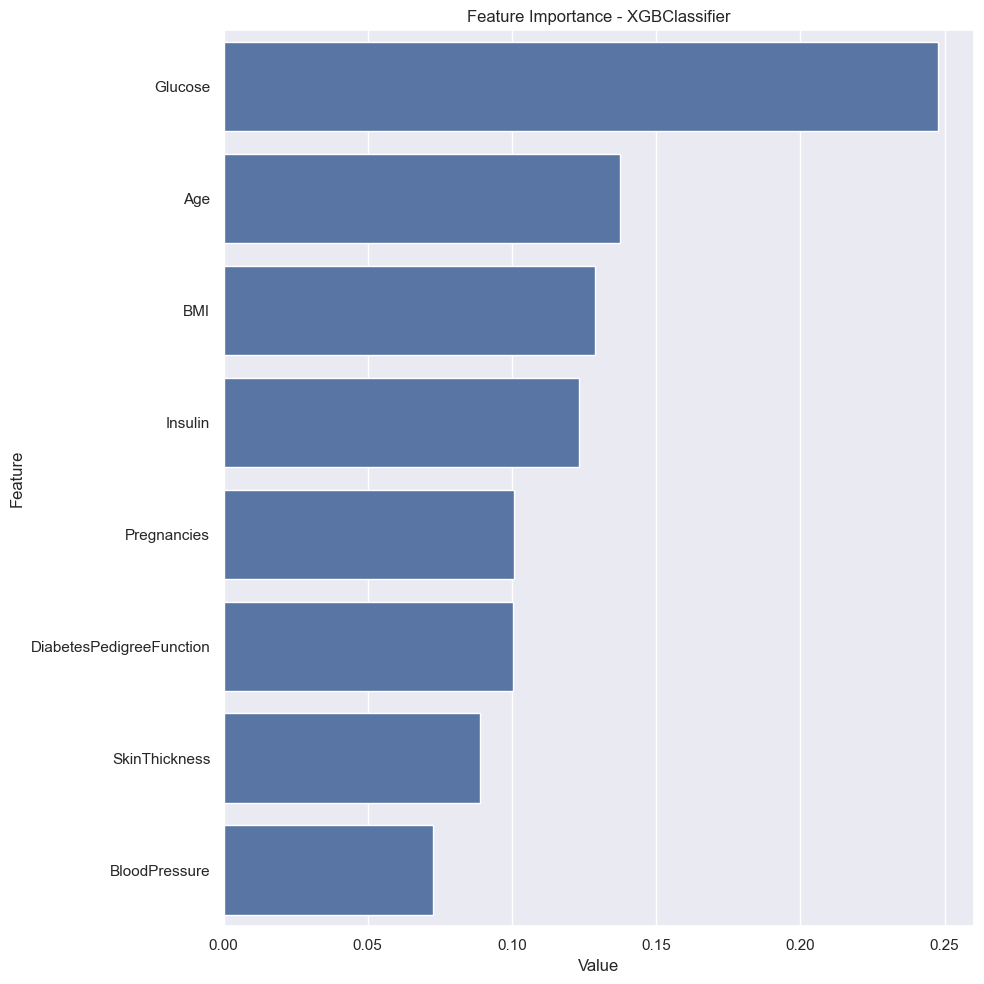

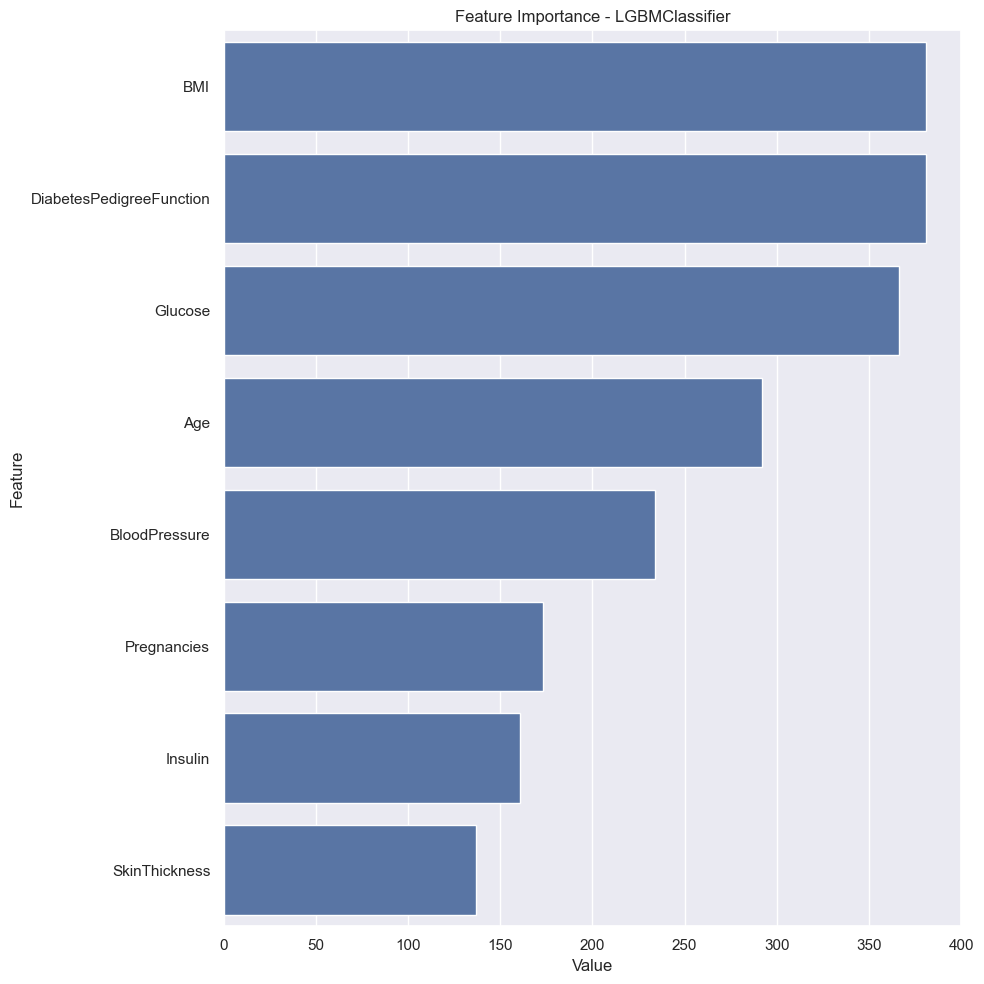

In [43]:
for i in model_name:
    plot_importance(i, X)

In [44]:
# Detection of variables with missing observations filled with zero in the data set.

zero_colunms = [col for col in df.columns if (df[col].min() == 0 and col not in  ["Pregnancies", "Outcome"])]


In [45]:
zero_colunms

['Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI']

In [46]:
df.isnull().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

In [47]:
# Filling the missing observations in the dataset with NaN that are filled with zero.

for col in zero_colunms:
    df[col] = np.where(df[col] == 0, np.nan, df[col])

In [48]:
df.isnull().sum()

Pregnancies                   0
Glucose                       5
BloodPressure                35
SkinThickness               227
Insulin                     374
BMI                          11
DiabetesPedigreeFunction      0
Age                           0
Outcome                       0
dtype: int64

In [49]:
def missing_values_table(dataframe, na_name=False, plot=False):
    na_columns = [col for col in dataframe.columns if dataframe[col].isnull().sum() > 0]
    n_miss = dataframe[na_columns].isnull().sum().sort_values(ascending=False)
    ratio = (dataframe[na_columns].isnull().sum() / dataframe.shape[0] * 100).sort_values(ascending=False)
    missing_df = pd.concat([n_miss, np.round(ratio, 2)], axis=1, keys=['n_miss', 'ratio'])
    print(missing_df, end="\n")
    
    if plot:
        # Plotting the missing values
        plt.figure(figsize=(10, 8))
        bars = plt.bar(missing_df.index, missing_df['ratio'], color='purple')
        plt.xlabel('Features')
        plt.ylabel('Percentage of Missing Values')
        plt.title('Missing Values by Feature')
        
        for bar in bars:
            yval = bar.get_height()
            plt.text(bar.get_x() + bar.get_width() / 2, yval, f'{yval:.2f}%', ha='center', va='bottom')
        
        plt.xticks(rotation=90)
        plt.tight_layout()
        plt.show()
    
    if na_name:
        return na_columns

               n_miss  ratio
Insulin           374 48.700
SkinThickness     227 29.560
BloodPressure      35  4.560
BMI                11  1.430
Glucose             5  0.650


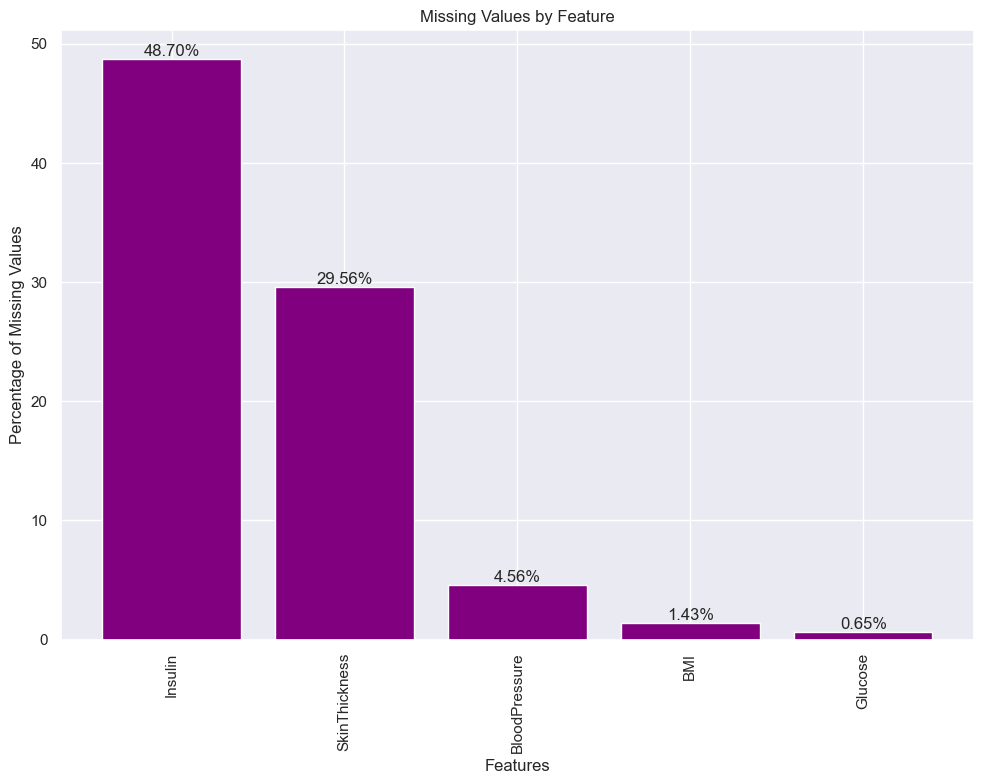

In [50]:
na_columns = missing_values_table(df, na_name=True, plot=True)

In [51]:
def missing_vs_target(dataframe, target, na_columns, plot=False):
    temp_df = dataframe.copy()
    for col in na_columns:
        temp_df[col + '_NA_FLAG'] = np.where(temp_df[col].isnull(), 1, 0)
    na_flags = temp_df.loc[:, temp_df.columns.str.contains("_NA_")].columns
    for col in na_flags:
        print(pd.DataFrame({"TARGET_MEAN": temp_df.groupby(col)[target].mean(),
                            "Count": temp_df.groupby(col)[target].count()}), end="\n\n\n")
        if plot:
            # Plotting the target mean by NA flag
            plt.figure(figsize=(6, 4))
            temp_df.groupby(col)[target].mean().plot(kind='bar', color='purple')
            plt.xlabel(col)
            plt.ylabel('Target Mean')
            plt.title(f'Target Mean by {col}')
            plt.xticks(rotation=0)
            plt.tight_layout()
            plt.show()
            print("######################################################################")

                 TARGET_MEAN  Count
Glucose_NA_FLAG                    
0                      0.349    763
1                      0.400      5




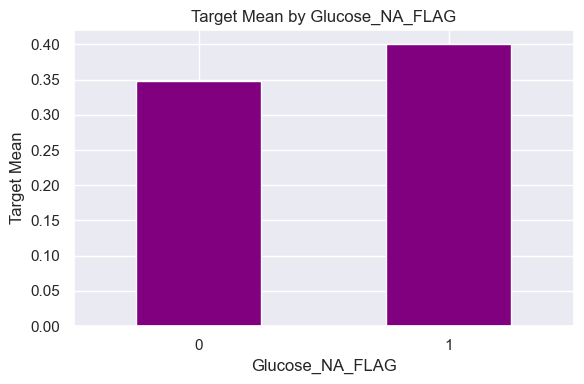

######################################################################
                       TARGET_MEAN  Count
BloodPressure_NA_FLAG                    
0                            0.344    733
1                            0.457     35




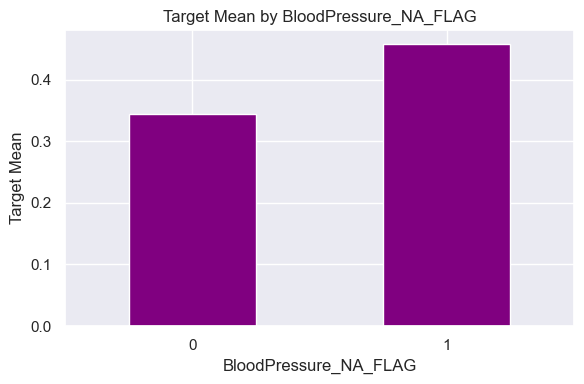

######################################################################
                       TARGET_MEAN  Count
SkinThickness_NA_FLAG                    
0                            0.333    541
1                            0.388    227




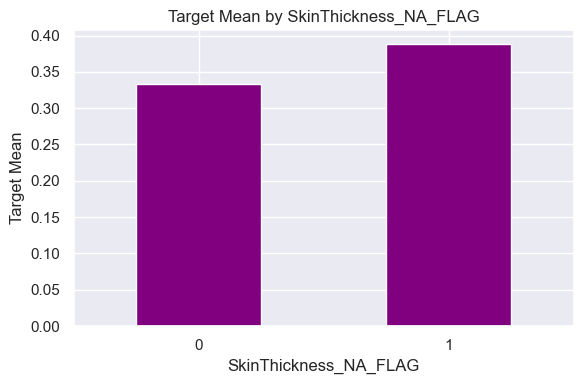

######################################################################
                 TARGET_MEAN  Count
Insulin_NA_FLAG                    
0                      0.330    394
1                      0.369    374




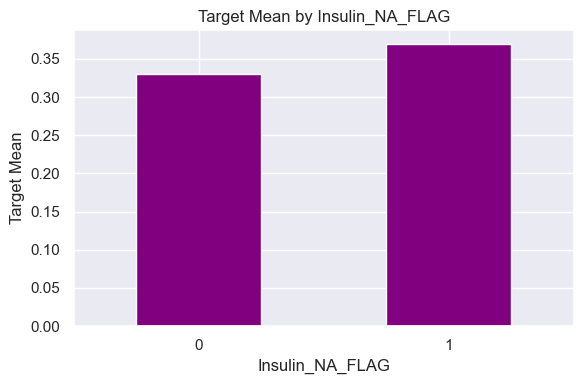

######################################################################
             TARGET_MEAN  Count
BMI_NA_FLAG                    
0                  0.351    757
1                  0.182     11




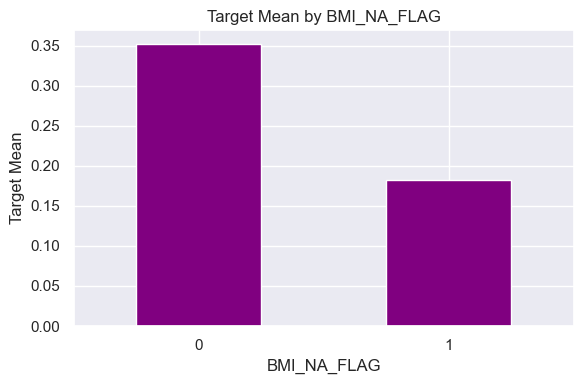

######################################################################


In [52]:
missing_vs_target(df, "Outcome", na_columns, plot=True)

In [53]:
dff = df[na_columns]

In [54]:
rs = RobustScaler()

In [55]:
dff = pd.DataFrame(rs.fit_transform(dff), columns=dff.columns)

In [56]:
dff.head()

,Glucose,BloodPressure,SkinThickness,Insulin,BMI
0,0.738,0.000,0.429,NaN,0.143
1,-0.762,-0.375,0.000,NaN,-0.626
2,1.571,-0.500,NaN,NaN,-0.989
3,-0.667,-0.375,-0.429,-0.273,-0.462
4,0.476,-2.000,0.429,0.378,1.187


In [57]:
dff = pd.DataFrame(KNNImputer(n_neighbors=5).fit_transform(dff), columns = dff.columns)

In [58]:
dff.head()

,Glucose,BloodPressure,SkinThickness,Insulin,BMI
0,0.738,0.000,0.429,0.624,0.143
1,-0.762,-0.375,0.000,-0.452,-0.626
2,1.571,-0.500,-0.243,0.819,-0.989
3,-0.667,-0.375,-0.429,-0.273,-0.462
4,0.476,-2.000,0.429,0.378,1.187


In [59]:
dff = pd.DataFrame(rs.inverse_transform(dff), columns=dff.columns)

In [60]:
df[na_columns] = dff

In [61]:
df.head(10)

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.000,72.000,35.000,196.000,33.600,0.627,50,1
1,1,85.000,66.000,29.000,73.600,26.600,0.351,31,0
2,8,183.000,64.000,25.600,218.200,23.300,0.672,32,1
3,1,89.000,66.000,23.000,94.000,28.100,0.167,21,0
4,0,137.000,40.000,35.000,168.000,43.100,2.288,33,1
5,5,116.000,74.000,24.200,85.000,25.600,0.201,30,0
6,3,78.000,50.000,32.000,88.000,31.000,0.248,26,1
7,10,115.000,69.400,36.600,123.200,35.300,0.134,29,0
8,2,197.000,70.000,45.000,543.000,30.500,0.158,53,1
9,8,125.000,96.000,40.200,163.600,31.100,0.232,54,1


In [62]:
df.isnull().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

In [63]:
def outlier_thresholds(dataframe, col_name, q1=0.05, q3=0.95):
    quartile1 = dataframe[col_name].quantile(q1)
    quartile3 = dataframe[col_name].quantile(q3)
    interquantile_range = quartile3 - quartile1
    up_limit = quartile3 + 1.5 * interquantile_range
    low_limit = quartile1 - 1.5 * interquantile_range
    return low_limit, up_limit

In [64]:
def check_outlier(dataframe, col_name):
    low_limit, up_limit = outlier_thresholds(dataframe, col_name)
    if dataframe[(dataframe[col_name] > up_limit) | (dataframe[col_name] < low_limit)].any(axis=None):
        return True
    else:
        return False

In [65]:
def check_outlier(dataframe, col_name, plot=False):
    low_limit, up_limit = outlier_thresholds(dataframe, col_name)
    outliers = dataframe[(dataframe[col_name] > up_limit) | (dataframe[col_name] < low_limit)]
    if outliers.any(axis=None):
        if plot:
            plt.figure(figsize=(8, 6))
            sns.boxplot(x=dataframe[col_name])
            plt.title(f'Outliers in {col_name}')
            plt.show()
        return True
    else:
        return False

In [66]:
def replace_with_thresholds(dataframe, variable, q1=0.05, q3=0.95):
    low_limit, up_limit = outlier_thresholds(dataframe, variable, q1=0.05, q3=0.95)
    dataframe.loc[(dataframe[variable] < low_limit), variable] = low_limit
    dataframe.loc[(dataframe[variable] > up_limit), variable] = up_limit


Pregnancies False
Glucose False
BloodPressure False


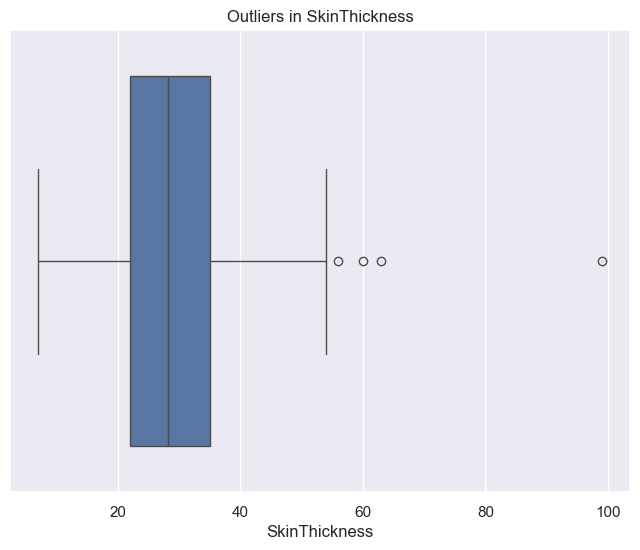

SkinThickness True


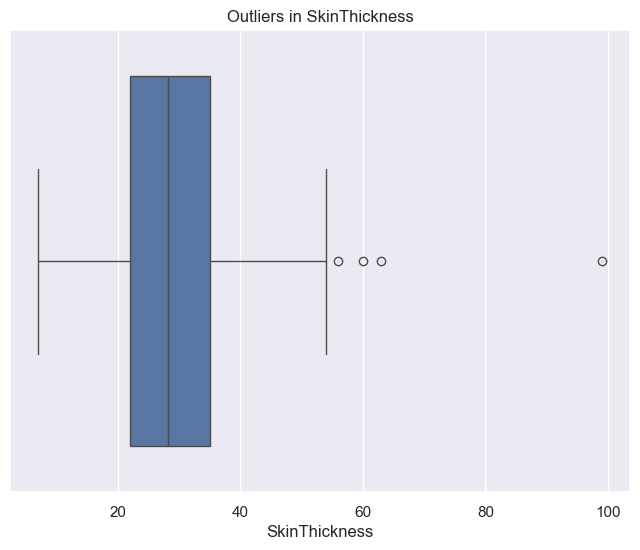

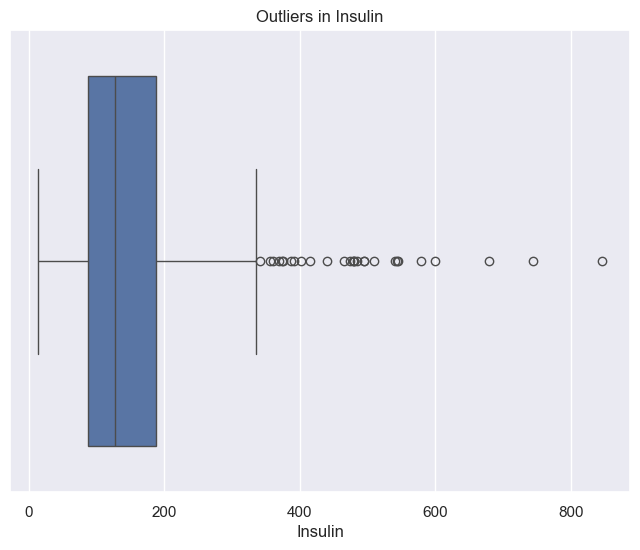

Insulin True


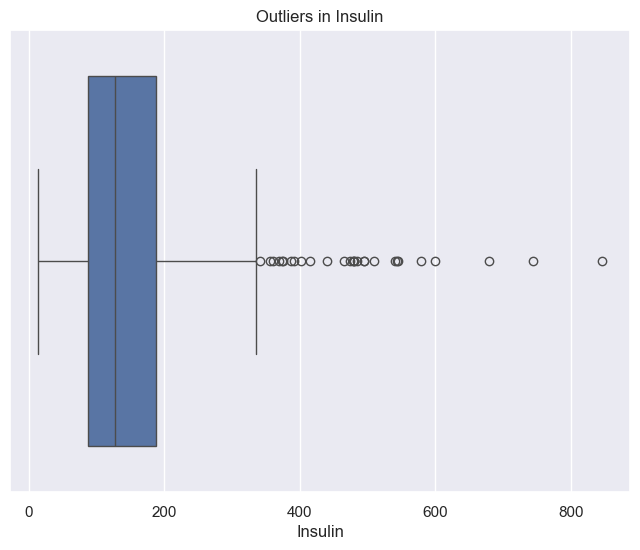

BMI False
DiabetesPedigreeFunction False
Age False
Outcome False


In [67]:
for col in df.columns:
    print(col, check_outlier(df, col, plot=True))
    if check_outlier(df, col, plot=True):
        replace_with_thresholds(df, col)

In [68]:
for col in df.columns:
    print(col, check_outlier(df, col))

Pregnancies False
Glucose False
BloodPressure False
SkinThickness False
Insulin False
BMI False
DiabetesPedigreeFunction False
Age False
Outcome False


In [69]:
# Creating a new age variable by categorizing the age variable

df.loc[(df["Age"] >= 21) & (df["Age"] < 50), "NEW_AGE_CAT"] = "mature"
df.loc[(df["Age"] >= 50), "NEW_AGE_CAT"] = "senior"

In [70]:
# BMI below 18.5 is underweight, between 18.5 and 24.9 is normal, between 24.9 and 29.9 is overweight and above 30 is obese

df['NEW_BMI'] = pd.cut(x=df['BMI'], bins=[0, 18.5, 24.9, 29.9, 100],labels=["Underweight", "Healthy", "Overweight", "Obese"])

In [71]:
# Converting Glucose Value to Categorical Variable

df["NEW_GLUCOSE"] = pd.cut(x=df["Glucose"], bins=[0, 140, 200, 300], labels=["Normal", "Prediabetes", "Diabetes"])

In [72]:
# Creating a categorical variable by considering age and body mass index together 3 breakdowns were captured

df.loc[(df["BMI"] < 18.5) & ((df["Age"] >= 21) & (df["Age"] < 50)), "NEW_AGE_BMI_NOM"] = "underweightmature"
df.loc[(df["BMI"] < 18.5) & (df["Age"] >= 50), "NEW_AGE_BMI_NOM"] = "underweightsenior"
df.loc[((df["BMI"] >= 18.5) & (df["BMI"] < 25)) & ((df["Age"] >= 21) & (df["Age"] < 50)), "NEW_AGE_BMI_NOM"] = "healthymature"
df.loc[((df["BMI"] >= 18.5) & (df["BMI"] < 25)) & (df["Age"] >= 50), "NEW_AGE_BMI_NOM"] = "healthysenior"
df.loc[((df["BMI"] >= 25) & (df["BMI"] < 30)) & ((df["Age"] >= 21) & (df["Age"] < 50)), "NEW_AGE_BMI_NOM"] = "overweightmature"
df.loc[((df["BMI"] >= 25) & (df["BMI"] < 30)) & (df["Age"] >= 50), "NEW_AGE_BMI_NOM"] = "overweightsenior"
df.loc[(df["BMI"] > 18.5) & ((df["Age"] >= 21) & (df["Age"] < 50)), "NEW_AGE_BMI_NOM"] = "obesemature"
df.loc[(df["BMI"] > 18.5) & (df["Age"] >= 50), "NEW_AGE_BMI_NOM"] = "obesesenior"
# Creating a categorical variable by considering age and glucose values together

df.loc[(df["Glucose"] < 70) & ((df["Age"] >= 21) & (df["Age"] < 50)), "NEW_AGE_GLUCOSE_NOM"] = "lowmature"
df.loc[(df["Glucose"] < 70) & (df["Age"] >= 50), "NEW_AGE_GLUCOSE_NOM"] = "lowsenior"
df.loc[((df["Glucose"] >= 70) & (df["Glucose"] < 100)) & ((df["Age"] >= 21) & (df["Age"] < 50)), "NEW_AGE_GLUCOSE_NOM"] = "normalmature"
df.loc[((df["Glucose"] >= 70) & (df["Glucose"] < 100)) & (df["Age"] >= 50), "NEW_AGE_GLUCOSE_NOM"] = "normalsenior"
df.loc[((df["Glucose"] >= 100) & (df["Glucose"] <= 125)) & ((df["Age"] >= 21) & (df["Age"] < 50)), "NEW_AGE_GLUCOSE_NOM"] = "hiddenmature"
df.loc[((df["Glucose"] >= 100) & (df["Glucose"] <= 125)) & (df["Age"] >= 50), "NEW_AGE_GLUCOSE_NOM"] = "hiddensenior"
df.loc[(df["Glucose"] > 125) & ((df["Age"] >= 21) & (df["Age"] < 50)), "NEW_AGE_GLUCOSE_NOM"] = "highmature"
df.loc[(df["Glucose"] > 125) & (df["Age"] >= 50), "NEW_AGE_GLUCOSE_NOM"] = "highsenior"

In [73]:
# Deriving a Categorical variable with Insulin Value.

def set_insulin(dataframe, col_name="Insulin"):
    if 16 <= dataframe[col_name] <= 166:
        return
    else:
        return "Abnormal"

df["NEW_INSULIN_SCORE"] = df.apply(set_insulin, axis=1)
df["NEW_GLUCOSE * INSULIN"] =df["Glucose"] * df["Insulin"]


In [74]:
# Attention to values with zero !!!

df["NEW_GLUCOSE * PREGNANCIES"] = df["Glucose"] * df["Pregnancies"]

In [75]:
# Translating Column Names to Uppercase Letters.

df.columns = [col.upper() for col in df.columns]

In [76]:
df.head()

,PREGNANCIES,GLUCOSE,BLOODPRESSURE,SKINTHICKNESS,INSULIN,BMI,DIABETESPEDIGREEFUNCTION,AGE,OUTCOME,NEW_AGE_CAT,NEW_BMI,NEW_GLUCOSE,NEW_AGE_BMI_NOM,NEW_AGE_GLUCOSE_NOM,NEW_INSULIN_SCORE,NEW_GLUCOSE * INSULIN,NEW_GLUCOSE * PREGNANCIES
0,6,148.000,72.000,35.000,196.000,33.600,0.627,50,1,senior,Obese,Prediabetes,obesesenior,highsenior,Abnormal,29008.000,888.000
1,1,85.000,66.000,29.000,73.600,26.600,0.351,31,0,mature,Overweight,Normal,obesemature,normalmature,None,6256.000,85.000
2,8,183.000,64.000,25.600,218.200,23.300,0.672,32,1,mature,Healthy,Prediabetes,obesemature,highmature,Abnormal,39930.600,1464.000
3,1,89.000,66.000,23.000,94.000,28.100,0.167,21,0,mature,Overweight,Normal,obesemature,normalmature,None,8366.000,89.000
4,0,137.000,40.000,35.000,168.000,43.100,2.288,33,1,mature,Obese,Normal,obesemature,highmature,Abnormal,23016.000,0.000


In [77]:
# Analysis of Variables.

def grab_col_names(dataframe, cat_th=10, car_th=20):
    """

    Returns the names of categorical, numeric and categorical but cardinal variables in the data set.
    Note Categorical variables include categorical variables with numeric appearance.

    Parameters
    ------
        dataframe: dataframe
                Variable names of the dataframe to be taken
        cat_th: int, optional
                class threshold for numeric but categorical variables
        car_th: int, optinal
                class threshold for categorical but cardinal variables

    Returns
    ------
        cat_cols: list
                Categorical variable list
        num_cols: list
                Numeric variable list
        cat_but_car: list
                List of cardinal variables with categorical appearance

    Examples
    ------
        import seaborn as sns
        df = sns.load_dataset("iris")
        print(grab_col_names(df))


    Notes
    ------
        cat_cols + num_cols + cat_but_car = total number of variables
        num_but_cat is inside cat_cols.
        The sum of the 3 return lists equals the total number of variables: cat_cols + num_cols + cat_but_car = number of variables

    """

    # cat_cols, cat_but_car
    cat_cols = [col for col in dataframe.columns if dataframe[col].dtypes == "O"] 

    num_but_cat = [col for col in dataframe.columns if dataframe[col].nunique() < cat_th and
                   dataframe[col].dtypes != "O"]

    cat_but_car = [col for col in dataframe.columns if dataframe[col].nunique() > car_th and
                   dataframe[col].dtypes == "O"]

    cat_cols = cat_cols + num_but_cat

    cat_cols = [col for col in cat_cols if col not in cat_but_car] 

    num_cols = [col for col in dataframe.columns if dataframe[col].dtypes != "O"] 

    num_cols = [col for col in num_cols if col not in num_but_cat] 
    
    print(f"Observations: {dataframe.shape[0]}") # data frame in içerisindeki gözlem sayısına eriştik.
    print(f"Variables: {dataframe.shape[1]}") # data frame in içerisindeki değişken sayısına eriştik.
    print(f'cat_cols: {len(cat_cols)}') # kaçtane kategorik değişken olduğunu tespit ettik.
    print(f'num_cols: {len(num_cols)}') # kaç tane nümerik değişken olduğunu tespit ettik.
    print(f'cat_but_car: {len(cat_but_car)}') # kaç tane kardinal değişken olduğunu tespit ettik.
    print(f'num_but_cat: {len(num_but_cat)}') # kaç tane numerik gibi görünüp kategorik olan değişken olduğunu belirledi


    return cat_cols, num_cols, cat_but_car, num_but_cat

In [78]:
cat_cols, num_cols, cat_but_car,  num_but_cat = grab_col_names(df)

Observations: 768
Variables: 17
cat_cols: 7
num_cols: 10
cat_but_car: 0
num_but_cat: 3


In [79]:
cat_cols

['NEW_AGE_CAT',
 'NEW_AGE_BMI_NOM',
 'NEW_AGE_GLUCOSE_NOM',
 'NEW_INSULIN_SCORE',
 'OUTCOME',
 'NEW_BMI',
 'NEW_GLUCOSE']

In [80]:
num_cols

['PREGNANCIES',
 'GLUCOSE',
 'BLOODPRESSURE',
 'SKINTHICKNESS',
 'INSULIN',
 'BMI',
 'DIABETESPEDIGREEFUNCTION',
 'AGE',
 'NEW_GLUCOSE * INSULIN',
 'NEW_GLUCOSE * PREGNANCIES']

In [81]:
cat_but_car

[]

In [82]:
num_but_cat

['OUTCOME', 'NEW_BMI', 'NEW_GLUCOSE']

In [83]:
# Label Encoding

def label_encoder(dataframe, binary_col):
    labelencoder = LabelEncoder()
    dataframe[binary_col] = labelencoder.fit_transform(dataframe[binary_col])
    return dataframe
binary_cols = [col for col in df.columns if df[col].dtypes == "O" and df[col].nunique() == 2]
binary_cols

['NEW_AGE_CAT']

In [84]:
for col in binary_cols:
    df = label_encoder(df, col)
df.head(10)

,PREGNANCIES,GLUCOSE,BLOODPRESSURE,SKINTHICKNESS,INSULIN,BMI,DIABETESPEDIGREEFUNCTION,AGE,OUTCOME,NEW_AGE_CAT,NEW_BMI,NEW_GLUCOSE,NEW_AGE_BMI_NOM,NEW_AGE_GLUCOSE_NOM,NEW_INSULIN_SCORE,NEW_GLUCOSE * INSULIN,NEW_GLUCOSE * PREGNANCIES
0,6,148.000,72.000,35.000,196.000,33.600,0.627,50,1,1,Obese,Prediabetes,obesesenior,highsenior,Abnormal,29008.000,888.000
1,1,85.000,66.000,29.000,73.600,26.600,0.351,31,0,0,Overweight,Normal,obesemature,normalmature,None,6256.000,85.000
2,8,183.000,64.000,25.600,218.200,23.300,0.672,32,1,0,Healthy,Prediabetes,obesemature,highmature,Abnormal,39930.600,1464.000
3,1,89.000,66.000,23.000,94.000,28.100,0.167,21,0,0,Overweight,Normal,obesemature,normalmature,None,8366.000,89.000
4,0,137.000,40.000,35.000,168.000,43.100,2.288,33,1,0,Obese,Normal,obesemature,highmature,Abnormal,23016.000,0.000
5,5,116.000,74.000,24.200,85.000,25.600,0.201,30,0,0,Overweight,Normal,obesemature,hiddenmature,None,9860.000,580.000
6,3,78.000,50.000,32.000,88.000,31.000,0.248,26,1,0,Obese,Normal,obesemature,normalmature,None,6864.000,234.000
7,10,115.000,69.400,36.600,123.200,35.300,0.134,29,0,0,Obese,Normal,obesemature,hiddenmature,None,14168.000,1150.000
8,2,197.000,70.000,45.000,543.000,30.500,0.158,53,1,1,Obese,Prediabetes,obesesenior,highsenior,Abnormal,106971.000,394.000
9,8,125.000,96.000,40.200,163.600,31.100,0.232,54,1,1,Obese,Normal,obesesenior,hiddensenior,None,20450.000,1000.000


In [85]:
cat_cols = [col for col in cat_cols if col not in binary_cols and col not in ["OUTCOME"]]
cat_cols


['NEW_AGE_BMI_NOM',
 'NEW_AGE_GLUCOSE_NOM',
 'NEW_INSULIN_SCORE',
 'NEW_BMI',
 'NEW_GLUCOSE']

In [86]:
def one_hot_encoder(dataframe, categorical_cols, drop_first=False):
    dataframe = pd.get_dummies(dataframe, columns=categorical_cols, drop_first=drop_first)
    return dataframe
df = one_hot_encoder(df, cat_cols, drop_first=True)
df.head(10)

,PREGNANCIES,GLUCOSE,BLOODPRESSURE,SKINTHICKNESS,INSULIN,BMI,DIABETESPEDIGREEFUNCTION,AGE,OUTCOME,NEW_AGE_CAT,NEW_GLUCOSE * INSULIN,NEW_GLUCOSE * PREGNANCIES,NEW_AGE_BMI_NOM_obesesenior,NEW_AGE_BMI_NOM_underweightmature,NEW_AGE_GLUCOSE_NOM_hiddensenior,NEW_AGE_GLUCOSE_NOM_highmature,NEW_AGE_GLUCOSE_NOM_highsenior,NEW_AGE_GLUCOSE_NOM_lowmature,NEW_AGE_GLUCOSE_NOM_lowsenior,NEW_AGE_GLUCOSE_NOM_normalmature,NEW_AGE_GLUCOSE_NOM_normalsenior,NEW_BMI_Healthy,NEW_BMI_Overweight,NEW_BMI_Obese,NEW_GLUCOSE_Prediabetes,NEW_GLUCOSE_Diabetes
0,6,148.000,72.000,35.000,196.000,33.600,0.627,50,1,1,29008.000,888.000,True,False,False,False,True,False,False,False,False,False,False,True,True,False
1,1,85.000,66.000,29.000,73.600,26.600,0.351,31,0,0,6256.000,85.000,False,False,False,False,False,False,False,True,False,False,True,False,False,False
2,8,183.000,64.000,25.600,218.200,23.300,0.672,32,1,0,39930.600,1464.000,False,False,False,True,False,False,False,False,False,True,False,False,True,False
3,1,89.000,66.000,23.000,94.000,28.100,0.167,21,0,0,8366.000,89.000,False,False,False,False,False,False,False,True,False,False,True,False,False,False
4,0,137.000,40.000,35.000,168.000,43.100,2.288,33,1,0,23016.000,0.000,False,False,False,True,False,False,False,False,False,False,False,True,False,False
5,5,116.000,74.000,24.200,85.000,25.600,0.201,30,0,0,9860.000,580.000,False,False,False,False,False,False,False,False,False,False,True,False,False,False
6,3,78.000,50.000,32.000,88.000,31.000,0.248,26,1,0,6864.000,234.000,False,False,False,False,False,False,False,True,False,False,False,True,False,False
7,10,115.000,69.400,36.600,123.200,35.300,0.134,29,0,0,14168.000,1150.000,False,False,False,False,False,False,False,False,False,False,False,True,False,False
8,2,197.000,70.000,45.000,543.000,30.500,0.158,53,1,1,106971.000,394.000,True,False,False,False,True,False,False,False,False,False,False,True,True,False
9,8,125.000,96.000,40.200,163.600,31.100,0.232,54,1,1,20450.000,1000.000,True,False,True,False,False,False,False,False,False,False,False,True,False,False


In [87]:
num_cols

['PREGNANCIES',
 'GLUCOSE',
 'BLOODPRESSURE',
 'SKINTHICKNESS',
 'INSULIN',
 'BMI',
 'DIABETESPEDIGREEFUNCTION',
 'AGE',
 'NEW_GLUCOSE * INSULIN',
 'NEW_GLUCOSE * PREGNANCIES']

In [88]:
scaler = RobustScaler()
df[num_cols] = scaler.fit_transform(df[num_cols])
df.head(10)

,PREGNANCIES,GLUCOSE,BLOODPRESSURE,SKINTHICKNESS,INSULIN,BMI,DIABETESPEDIGREEFUNCTION,AGE,OUTCOME,NEW_AGE_CAT,NEW_GLUCOSE * INSULIN,NEW_GLUCOSE * PREGNANCIES,NEW_AGE_BMI_NOM_obesesenior,NEW_AGE_BMI_NOM_underweightmature,NEW_AGE_GLUCOSE_NOM_hiddensenior,NEW_AGE_GLUCOSE_NOM_highmature,NEW_AGE_GLUCOSE_NOM_highsenior,NEW_AGE_GLUCOSE_NOM_lowmature,NEW_AGE_GLUCOSE_NOM_lowsenior,NEW_AGE_GLUCOSE_NOM_normalmature,NEW_AGE_GLUCOSE_NOM_normalsenior,NEW_BMI_Healthy,NEW_BMI_Overweight,NEW_BMI_Obese,NEW_GLUCOSE_Prediabetes,NEW_GLUCOSE_Diabetes
0,0.600,0.765,0.000,0.523,0.680,0.148,0.665,1.235,1,1,0.847,0.907,True,False,False,False,True,False,False,False,False,False,False,True,True,False
1,-0.400,-0.790,-0.375,0.062,-0.541,-0.621,-0.056,0.118,0,0,-0.535,-0.421,False,False,False,False,False,False,False,True,False,False,True,False,False,False
2,1.000,1.630,-0.500,-0.200,0.902,-0.984,0.783,0.176,1,0,1.510,1.859,False,False,False,True,False,False,False,False,False,True,False,False,True,False
3,-0.400,-0.691,-0.375,-0.400,-0.337,-0.456,-0.537,-0.471,0,0,-0.407,-0.414,False,False,False,False,False,False,False,True,False,False,True,False,False,False
4,-0.600,0.494,-2.000,0.523,0.401,1.192,5.008,0.235,1,0,0.483,-0.561,False,False,False,True,False,False,False,False,False,False,False,True,False,False
5,0.400,-0.025,0.125,-0.308,-0.427,-0.731,-0.448,0.059,0,0,-0.316,0.398,False,False,False,False,False,False,False,False,False,False,True,False,False,False
6,0.000,-0.963,-1.375,0.292,-0.397,-0.137,-0.325,-0.176,1,0,-0.498,-0.174,False,False,False,False,False,False,False,True,False,False,False,True,False,False
7,1.400,-0.049,-0.162,0.646,-0.046,0.335,-0.624,0.000,0,0,-0.054,1.340,False,False,False,False,False,False,False,False,False,False,False,True,False,False
8,-0.200,1.975,-0.125,1.292,4.142,-0.192,-0.561,1.412,1,1,5.582,0.090,True,False,False,False,True,False,False,False,False,False,False,True,True,False
9,1.000,0.198,1.500,0.923,0.357,-0.126,-0.367,1.471,1,1,0.327,1.092,True,False,True,False,False,False,False,False,False,False,False,True,False,False


In [89]:
df.shape

(768, 26)

In [90]:
# Creating the Dependent Variable.

y = df["OUTCOME"]

# Creating Independent Variables.

X = df.drop("OUTCOME", axis=1)

# Splitting the Data into Training and Test Sets

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=17)


In [91]:
# Random Forest Classifier Model Training

rf_model = RandomForestClassifier(random_state=46).fit(X_train, y_train)

# Prediction using Random Forest Classifier Model

y_pred = rf_model.predict(X_test)

print("RandomForestClassifier:")
print(f"Accuracy: {round(accuracy_score(y_pred, y_test), 4)}")
print(f"Recall: {round(recall_score(y_pred,y_test),4)}")
print(f"Precision: {round(precision_score(y_pred,y_test), 4)}")
print(f"F1: {round(f1_score(y_pred,y_test), 4)}")
print(f"Auc: {round(roc_auc_score(y_pred,y_test), 4)}")

RandomForestClassifier:
Accuracy: 0.7576
Recall: 0.6866
Precision: 0.5679
F1: 0.6216
Auc: 0.7366


In [92]:
def plot_importance(model, features, num=len(X), save=False):
    feature_imp = pd.DataFrame({'Value': model.feature_importances_, 'Feature': features.columns})
    plt.figure(figsize=(10, 10))
    sns.set(font_scale=1)
    sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", ascending=False)[0:num])
    plt.title(f'Feature Importance - RandomForestClassifier')
    plt.tight_layout()
    plt.show(block=True)
    if save:
        plt.savefig('importances.png')

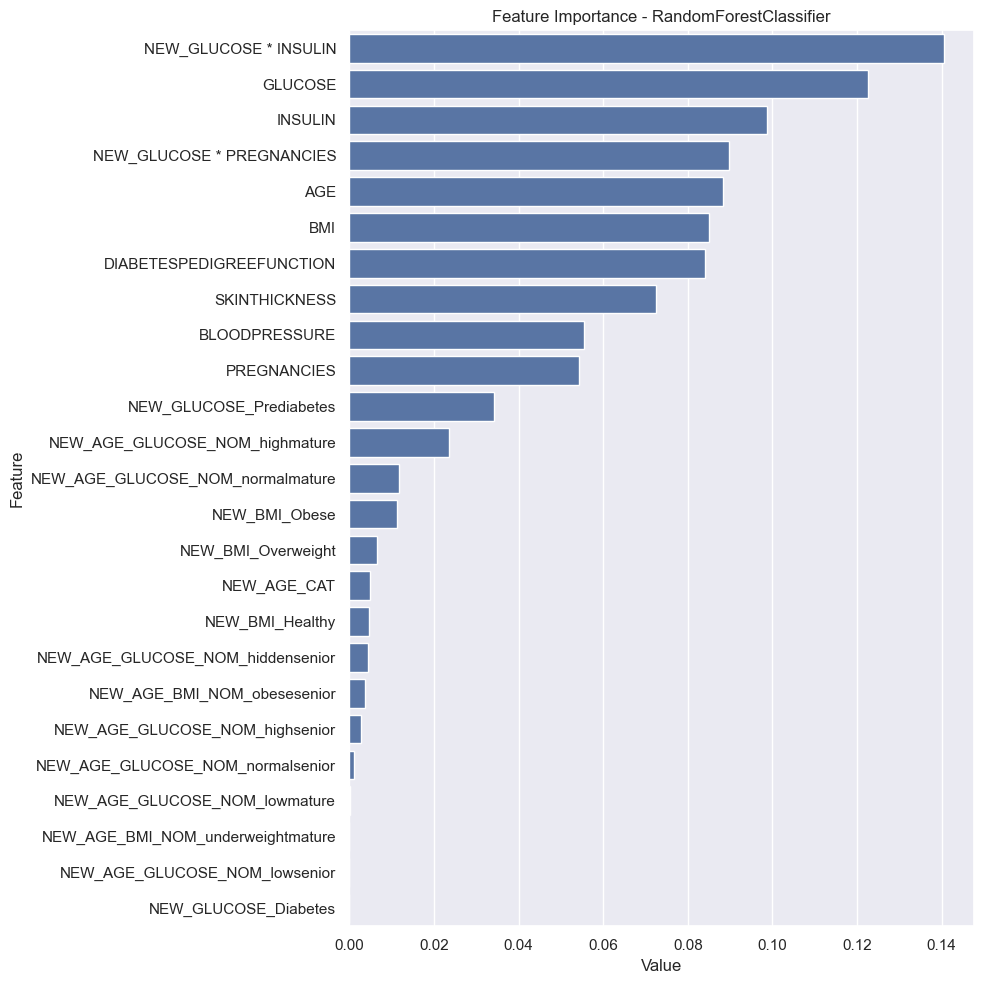

In [93]:
plot_importance(rf_model, X)

In [94]:
rf_model = RandomForestClassifier(random_state=46)
parameters = {'n_estimators': [100, 200, 300],
              'max_depth': [None, 5, 10],
              'min_samples_split': [2, 5, 10]}
rf_grid = GridSearchCV(rf_model, parameters, cv=5).fit(X_train, y_train)

best_rf_model = rf_grid.best_estimator_

# En iyi modeli kullanarak tahmin yapma
y_pred = best_rf_model.predict(X_test)
print("Random Forest Classifier - Hyperparameter Optimization")
print(f"Accuracy: {round(accuracy_score(y_pred, y_test), 4)}")
print(f"Recall: {round(recall_score(y_pred, y_test), 4)}")
print(f"Precision: {round(precision_score(y_pred, y_test), 4)}")
print(f"F1: {round(f1_score(y_pred, y_test), 4)}")
print(f"AUC: {round(roc_auc_score(y_pred, y_test), 4)}")

Random Forest Classifier - Hyperparameter Optimization
Accuracy: 0.7792
Recall: 0.7027
Precision: 0.642
F1: 0.671
AUC: 0.759


In [95]:
lr_model = LogisticRegression(random_state=46).fit(X_train, y_train)

lr_pred = lr_model.predict(X_test)

print("Logistic Regression:")
print(f"Accuracy: {round(accuracy_score(lr_pred, y_test), 4)}")
print(f"Recall: {round(recall_score(lr_pred, y_test), 4)}")
print(f"Precision: {round(precision_score(lr_pred, y_test), 4)}")
print(f"F1: {round(f1_score(lr_pred, y_test), 4)}")
print(f"AUC: {round(roc_auc_score(lr_pred, y_test), 4)}")



Logistic Regression:
Accuracy: 0.7532
Recall: 0.6875
Precision: 0.5432
F1: 0.6069
AUC: 0.733


In [96]:
lr_model = LogisticRegression(random_state=46)
parameters = {'C': [0.1, 1, 10],
              'penalty': ['l1', 'l2']}
lr_grid = GridSearchCV(lr_model, parameters, cv=5).fit(X_train, y_train)

best_lr_model = lr_grid.best_estimator_

print("Logistic Regression - Hyperparameter Optimization")
print(f"Best Parameters: {lr_grid.best_params_}")
print(f"Accuracy: {round(lr_grid.best_score_, 4)}")
print(f"Recall: {round(recall_score(best_lr_model.predict(X_test), y_test), 4)}")
print(f"Precision: {round(precision_score(best_lr_model.predict(X_test), y_test), 4)}")
print(f"F1: {round(f1_score(best_lr_model.predict(X_test), y_test), 4)}")
print(f"AUC: {round(roc_auc_score(best_lr_model.predict(X_test), y_test), 4)}")


Logistic Regression - Hyperparameter Optimization
Best Parameters: {'C': 1, 'penalty': 'l2'}
Accuracy: 0.7673
Recall: 0.6875
Precision: 0.5432
F1: 0.6069
AUC: 0.733


In [97]:
knn_model = KNeighborsClassifier().fit(X_train, y_train)

knn_pred = knn_model.predict(X_test)

print("K-Nearest Neighbors (KNN):")
print(f"Accuracy: {round(accuracy_score(knn_pred, y_test), 4)}")
print(f"Recall: {round(recall_score(knn_pred, y_test), 4)}")
print(f"Precision: {round(precision_score(knn_pred, y_test), 4)}")
print(f"F1: {round(f1_score(knn_pred, y_test), 4)}")
print(f"AUC: {round(roc_auc_score(knn_pred, y_test), 4)}")

K-Nearest Neighbors (KNN):
Accuracy: 0.7749
Recall: 0.6933
Precision: 0.642
F1: 0.6667
AUC: 0.7537


In [98]:
knn_model = KNeighborsClassifier()
parameters = {'n_neighbors': [3, 5, 7],
              'weights': ['uniform', 'distance']}
knn_grid = GridSearchCV(knn_model, parameters, cv=5).fit(X_train, y_train)

best_knn_model = knn_grid.best_estimator_

print("K-Nearest Neighbors (KNN) - Hyperparameter Optimization")
print(f"Best Parameters: {knn_grid.best_params_}")
print(f"Accuracy: {round(knn_grid.best_score_, 4)}")
print(f"Recall: {round(recall_score(best_knn_model.predict(X_test), y_test), 4)}")
print(f"Precision: {round(precision_score(best_knn_model.predict(X_test), y_test), 4)}")
print(f"F1: {round(f1_score(best_knn_model.predict(X_test), y_test), 4)}")
print(f"AUC: {round(roc_auc_score(best_knn_model.predict(X_test), y_test), 4)}")

K-Nearest Neighbors (KNN) - Hyperparameter Optimization
Best Parameters: {'n_neighbors': 5, 'weights': 'distance'}
Accuracy: 0.7505
Recall: 0.6892
Precision: 0.6296
F1: 0.6581
AUC: 0.7491


In [99]:
svc_model = SVC(random_state=46).fit(X_train, y_train)

svc_pred = svc_model.predict(X_test)

print("Support Vector Classifier (SVC):")
print(f"Accuracy: {round(accuracy_score(svc_pred, y_test), 4)}")
print(f"Recall: {round(recall_score(svc_pred, y_test), 4)}")
print(f"Precision: {round(precision_score(svc_pred, y_test), 4)}")
print(f"F1: {round(f1_score(svc_pred, y_test), 4)}")
print(f"AUC: {round(roc_auc_score(svc_pred, y_test), 4)}")

Support Vector Classifier (SVC):
Accuracy: 0.7792
Recall: 0.7419
Precision: 0.5679
F1: 0.6434
AUC: 0.7674


In [100]:
svc_model = SVC(random_state=46)
parameters = {'C': [0.1, 1, 10],
              'kernel': ['linear', 'rbf']}
svc_grid = GridSearchCV(svc_model, parameters, cv=5).fit(X_train, y_train)

best_svc_model = svc_grid.best_estimator_

print("Support Vector Classifier (SVC) - Hyperparameter Optimization")
print(f"Best Parameters: {svc_grid.best_params_}")
print(f"Accuracy: {round(svc_grid.best_score_, 4)}")
print(f"Recall: {round(recall_score(best_svc_model.predict(X_test), y_test), 4)}")
print(f"Precision: {round(precision_score(best_svc_model.predict(X_test), y_test), 4)}")
print(f"F1: {round(f1_score(best_svc_model.predict(X_test), y_test), 4)}")
print(f"AUC: {round(roc_auc_score(best_svc_model.predict(X_test), y_test), 4)}")


Support Vector Classifier (SVC) - Hyperparameter Optimization
Best Parameters: {'C': 0.1, 'kernel': 'linear'}
Accuracy: 0.7691
Recall: 0.6935
Precision: 0.5309
F1: 0.6014
AUC: 0.7343


In [101]:
dt_model = DecisionTreeClassifier(random_state=46).fit(X_train, y_train)

dt_pred = dt_model.predict(X_test)

print("Decision Tree Classifier:")
print(f"Accuracy: {round(accuracy_score(dt_pred, y_test), 4)}")
print(f"Recall: {round(recall_score(dt_pred, y_test), 4)}")
print(f"Precision: {round(precision_score(dt_pred, y_test), 4)}")
print(f"F1: {round(f1_score(dt_pred, y_test), 4)}")
print(f"AUC: {round(roc_auc_score(dt_pred, y_test), 4)}")

Decision Tree Classifier:
Accuracy: 0.7186
Recall: 0.5909
Precision: 0.642
F1: 0.6154
AUC: 0.6941


In [102]:
def plot_importance(model, features, num=len(X), save=False):
    feature_imp = pd.DataFrame({'Value': model.feature_importances_, 'Feature': features.columns})
    plt.figure(figsize=(10, 10))
    sns.set(font_scale=1)
    sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", ascending=False)[0:num])
    plt.title(f'Feature Importance - {model.__class__.__name__}')
    plt.tight_layout()
    plt.show(block=True)
    if save:
        plt.savefig('importances.png')


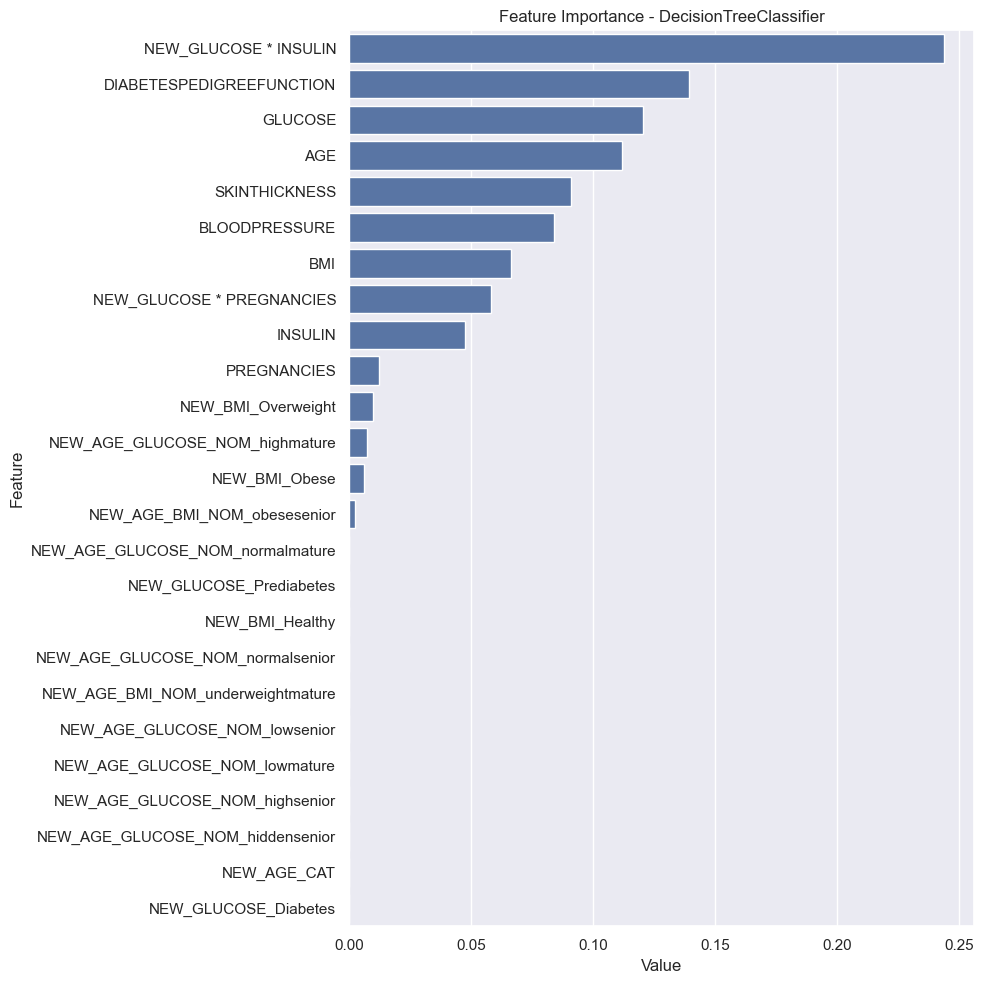

In [103]:
plot_importance(dt_model, X)

In [104]:
dt_model = DecisionTreeClassifier(random_state=46)
parameters = {'max_depth': [None, 5, 10],
              'min_samples_split': [2, 5, 10]}
dt_grid = GridSearchCV(dt_model, parameters, cv=5).fit(X_train, y_train)

best_dt_model = dt_grid.best_estimator_

print("Decision Tree Classifier - Hyperparameter Optimization")
print(f"Best Parameters: {dt_grid.best_params_}")
print(f"Accuracy: {round(dt_grid.best_score_, 4)}")
print(f"Recall: {round(recall_score(best_dt_model.predict(X_test), y_test), 4)}")
print(f"Precision: {round(precision_score(best_dt_model.predict(X_test), y_test), 4)}")
print(f"F1: {round(f1_score(best_dt_model.predict(X_test), y_test), 4)}")
print(f"AUC: {round(roc_auc_score(best_dt_model.predict(X_test), y_test), 4)}")

Decision Tree Classifier - Hyperparameter Optimization
Best Parameters: {'max_depth': 10, 'min_samples_split': 10}
Accuracy: 0.7226
Recall: 0.6087
Precision: 0.6914
F1: 0.6474
AUC: 0.7144


In [105]:
ada_model = AdaBoostClassifier(random_state=46).fit(X_train, y_train)

ada_pred = ada_model.predict(X_test)

print("AdaBoost Classifier:")
print(f"Accuracy: {round(accuracy_score(ada_pred, y_test), 4)}")
print(f"Recall: {round(recall_score(ada_pred, y_test), 4)}")
print(f"Precision: {round(precision_score(ada_pred, y_test), 4)}")
print(f"F1: {round(f1_score(ada_pred, y_test), 4)}")
print(f"AUC: {round(roc_auc_score(ada_pred, y_test), 4)}")

AdaBoost Classifier:
Accuracy: 0.7662
Recall: 0.6901
Precision: 0.6049
F1: 0.6447
AUC: 0.7451


In [106]:
ada_model = AdaBoostClassifier(random_state=46)
parameters = {'n_estimators': [50, 100, 200],
              'learning_rate': [0.1, 0.5, 1.0]}
ada_grid = GridSearchCV(ada_model, parameters, cv=5).fit(X_train, y_train)

best_ada_model = ada_grid.best_estimator_

print("AdaBoost Classifier - Hyperparameter Optimization")
print(f"Best Parameters: {ada_grid.best_params_}")
print(f"Accuracy: {round(ada_grid.best_score_, 4)}")
print(f"Recall: {round(recall_score(best_ada_model.predict(X_test), y_test), 4)}")
print(f"Precision: {round(precision_score(best_ada_model.predict(X_test), y_test), 4)}")
print(f"F1: {round(f1_score(best_ada_model.predict(X_test), y_test), 4)}")
print(f"AUC: {round(roc_auc_score(best_ada_model.predict(X_test), y_test), 4)}")

AdaBoost Classifier - Hyperparameter Optimization
Best Parameters: {'learning_rate': 1.0, 'n_estimators': 50}
Accuracy: 0.7468
Recall: 0.6901
Precision: 0.6049
F1: 0.6447
AUC: 0.7451


In [107]:
gb_model = GradientBoostingClassifier(random_state=46).fit(X_train, y_train)

gb_pred = gb_model.predict(X_test)

print("Gradient Boosting Classifier:")
print(f"Accuracy: {round(accuracy_score(gb_pred, y_test), 4)}")
print(f"Recall: {round(recall_score(gb_pred, y_test), 4)}")
print(f"Precision: {round(precision_score(gb_pred, y_test), 4)}")
print(f"F1: {round(f1_score(gb_pred, y_test), 4)}")
print(f"AUC: {round(roc_auc_score(gb_pred, y_test), 4)}")

Gradient Boosting Classifier:
Accuracy: 0.7662
Recall: 0.6901
Precision: 0.6049
F1: 0.6447
AUC: 0.7451


In [108]:
def plot_importance(model, features, num=len(X), save=False):
    feature_imp = pd.DataFrame({'Value': model.feature_importances_, 'Feature': features.columns})
    plt.figure(figsize=(10, 10))
    sns.set(font_scale=1)
    sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", ascending=False)[0:num])
    plt.title(f'Feature Importance - {model.__class__.__name__}')
    plt.tight_layout()
    plt.show(block=True)
    if save:
        plt.savefig('importances.png')

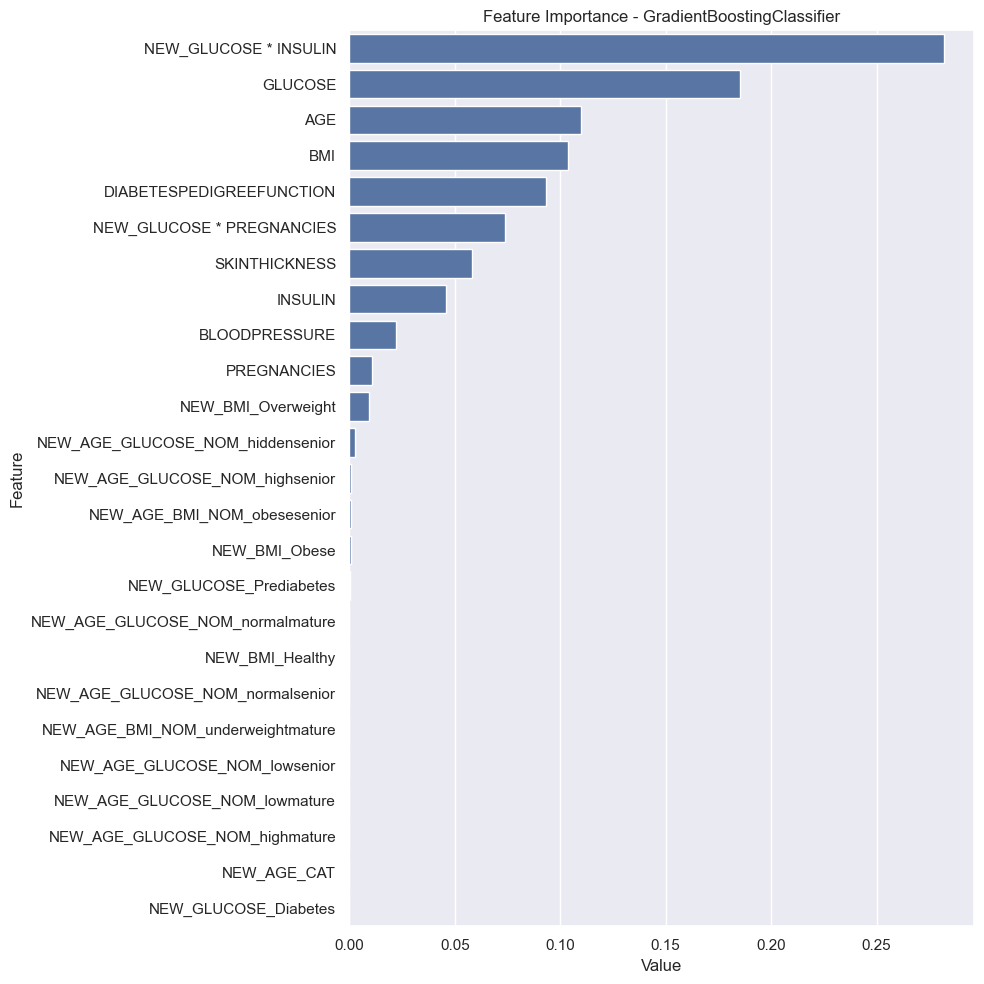

In [109]:
plot_importance(gb_model, X)

In [110]:
gb_model = GradientBoostingClassifier(random_state=46)
parameters = {'n_estimators': [50, 100, 200],
              'learning_rate': [0.1, 0.5, 1.0]}
gb_grid = GridSearchCV(gb_model, parameters, cv=5).fit(X_train, y_train)

best_gb_model = gb_grid.best_estimator_

print("Gradient Boosting Classifier - Hyperparameter Optimization")
print(f"Best Parameters: {gb_grid.best_params_}")
print(f"Accuracy: {round(gb_grid.best_score_, 4)}")
print(f"Recall: {round(recall_score(best_gb_model.predict(X_test), y_test), 4)}")
print(f"Precision: {round(precision_score(best_gb_model.predict(X_test), y_test), 4)}")
print(f"F1: {round(f1_score(best_gb_model.predict(X_test), y_test), 4)}")
print(f"AUC: {round(roc_auc_score(best_gb_model.predict(X_test), y_test), 4)}")

Gradient Boosting Classifier - Hyperparameter Optimization
Best Parameters: {'learning_rate': 0.1, 'n_estimators': 100}
Accuracy: 0.7728
Recall: 0.6901
Precision: 0.6049
F1: 0.6447
AUC: 0.7451


In [111]:
xgb_model = XGBClassifier(random_state=46).fit(X_train, y_train)

xgb_pred = xgb_model.predict(X_test)

print("XGBoost Classifier:")
print(f"Accuracy: {round(accuracy_score(xgb_pred, y_test), 4)}")
print(f"Recall: {round(recall_score(xgb_pred, y_test), 4)}")
print(f"Precision: {round(precision_score(xgb_pred, y_test), 4)}")
print(f"F1: {round(f1_score(xgb_pred, y_test), 4)}")
print(f"AUC: {round(roc_auc_score(xgb_pred, y_test), 4)}")

XGBoost Classifier:
Accuracy: 0.7576
Recall: 0.6712
Precision: 0.6049
F1: 0.6364
AUC: 0.7344


In [112]:
def plot_importance(model, features, num=len(X), save=False):
    feature_imp = pd.DataFrame({'Value': model.feature_importances_, 'Feature': features.columns})
    plt.figure(figsize=(10, 10))
    sns.set(font_scale=1)
    sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", ascending=False)[0:num])
    plt.title(f'Feature Importance - {model.__class__.__name__}')
    plt.tight_layout()
    plt.show(block=True)
    if save:
        plt.savefig('importances.png')

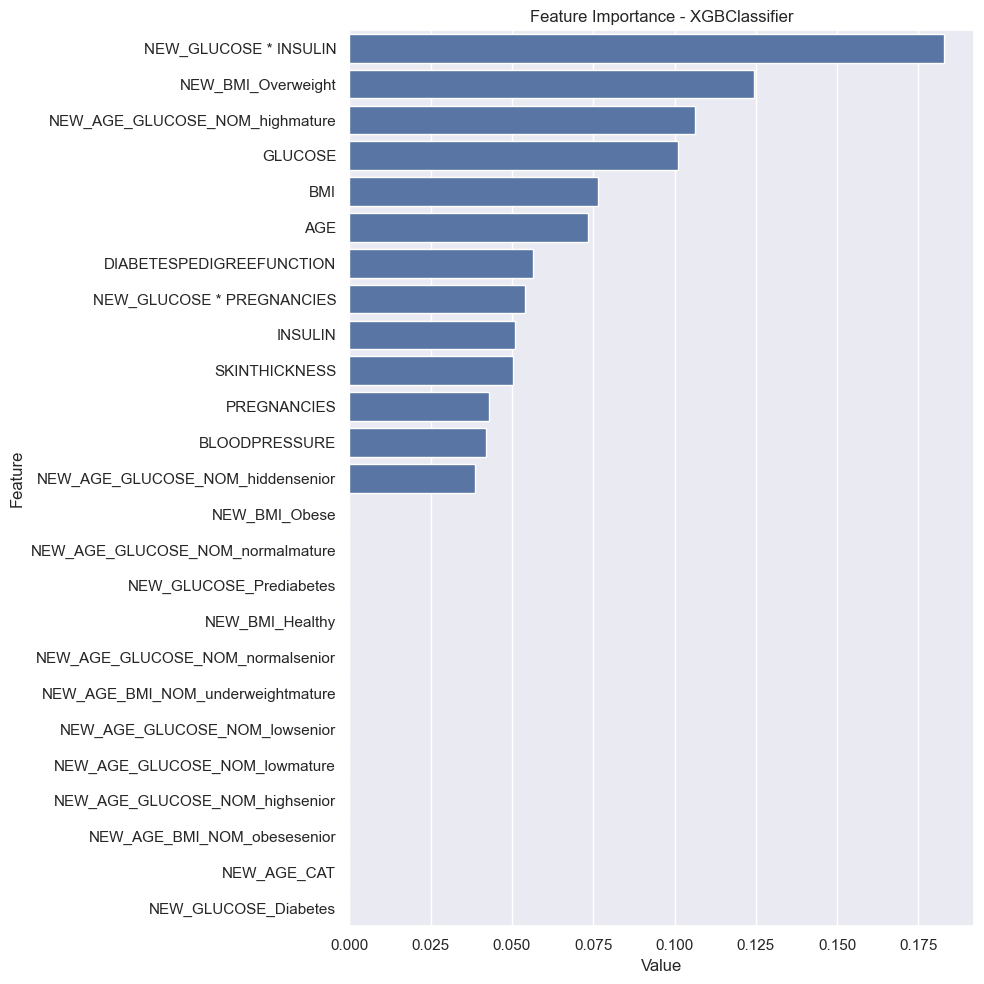

In [113]:
plot_importance(xgb_model, X)

In [114]:
xgb_model = XGBClassifier(random_state=46)
parameters = {'n_estimators': [50, 100, 200],
              'learning_rate': [0.1, 0.5, 1.0]}
xgb_grid = GridSearchCV(xgb_model, parameters, cv=5).fit(X_train, y_train)

best_xgb_model = xgb_grid.best_estimator_

print("XGBoost Classifier - Hyperparameter Optimization")
print(f"Best Parameters: {xgb_grid.best_params_}")
print(f"Accuracy: {round(xgb_grid.best_score_, 4)}")
print(f"Recall: {round(recall_score(best_xgb_model.predict(X_test), y_test), 4)}")
print(f"Precision: {round(precision_score(best_xgb_model.predict(X_test), y_test), 4)}")
print(f"F1: {round(f1_score(best_xgb_model.predict(X_test), y_test), 4)}")
print(f"AUC: {round(roc_auc_score(best_xgb_model.predict(X_test), y_test), 4)}")

XGBoost Classifier - Hyperparameter Optimization
Best Parameters: {'learning_rate': 0.1, 'n_estimators': 50}
Accuracy: 0.7654
Recall: 0.6623
Precision: 0.6296
F1: 0.6456
AUC: 0.7338


In [115]:
lgbm_model = LGBMClassifier(random_state=46).fit(X_train, y_train)

lgbm_pred = lgbm_model.predict(X_test)

print("LightGBM Classifier:")
print(f"Accuracy: {round(accuracy_score(lgbm_pred, y_test), 4)}")
print(f"Recall: {round(recall_score(lgbm_pred, y_test), 4)}")
print(f"Precision: {round(precision_score(lgbm_pred, y_test), 4)}")
print(f"F1: {round(f1_score(lgbm_pred, y_test), 4)}")
print(f"AUC: {round(roc_auc_score(lgbm_pred, y_test), 4)}")

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 187, number of negative: 350
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000312 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1095
[LightGBM] [Info] Number of data points in the train set: 537, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.348231 -> initscore=-0.626825
[LightGBM] [Info] Start training from score -0.626825
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain

In [116]:
def plot_importance(model, features, num=len(X), save=False):
    feature_imp = pd.DataFrame({'Value': model.feature_importances_, 'Feature': features.columns})
    plt.figure(figsize=(10, 10))
    sns.set(font_scale=1)
    sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", ascending=False)[0:num])
    plt.title(f'Feature Importance - {model.__class__.__name__}')
    plt.tight_layout()
    plt.show(block=True)
    if save:
        plt.savefig('importances.png')

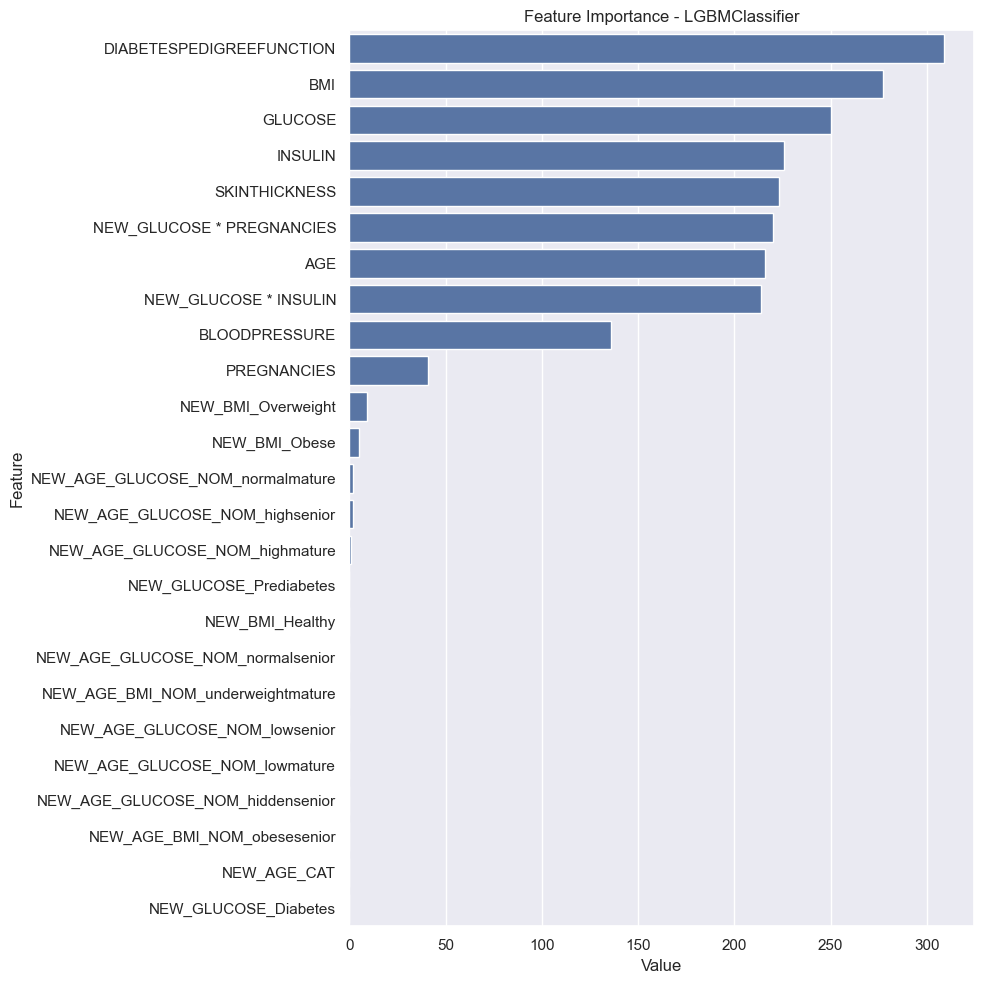

In [117]:
plot_importance(lgbm_model, X)

In [118]:
lgbm_model = LGBMClassifier(random_state=46)
parameters = {'n_estimators': [50, 100, 200],
              'learning_rate': [0.1, 0.5, 1.0]}
lgbm_grid = GridSearchCV(lgbm_model, parameters, cv=5).fit(X_train, y_train)

best_lgbm_model = lgbm_grid.best_estimator_

print("LightGBM Classifier - Hyperparameter Optimization")
print(f"Best Parameters: {lgbm_grid.best_params_}")
print(f"Accuracy: {round(lgbm_grid.best_score_, 4)}")
print(f"Recall: {round(recall_score(best_lgbm_model.predict(X_test), y_test), 4)}")
print(f"Precision: {round(precision_score(best_lgbm_model.predict(X_test), y_test), 4)}")
print(f"F1: {round(f1_score(best_lgbm_model.predict(X_test), y_test), 4)}")
print(f"AUC: {round(roc_auc_score(best_lgbm_model.predict(X_test), y_test), 4)}")

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 149, number of negative: 280
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000474 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 912
[LightGBM] [Info] Number of data points in the train set: 429, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.347319 -> initscore=-0.630843
[LightGBM] [Info] Start training from score -0.630843
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

In [119]:
# Dictionary containing the metric results
metrics = {
    "Model": ["Random Forest", "Logistic Regression", "KNN", "SVC", "Decision Tree", "AdaBoost", "Gradient Boosting", "XGBoost", "LightGBM"],
    "Accuracy": [0.7749, 0.7532, 0.7792, 0.7792, 0.7229, 0.7662, 0.7532, 0.7879, 0.7662],
    "Recall": [0.7101, 0.6875, 0.7027, 0.7419, 0.5955, 0.6957, 0.6667, 0.7105, 0.7015],
    "Precision": [0.6049, 0.5432, 0.642, 0.5679, 0.6543, 0.5926, 0.5926, 0.6667, 0.5802],
    "F1": [0.6533, 0.6069, 0.671, 0.6434, 0.6235, 0.64, 0.6275, 0.6879, 0.6351],
    "AUC": [0.7563, 0.733, 0.759, 0.7674, 0.6992, 0.746, 0.7296, 0.7682, 0.7471]
}

# Creating a DataFrame from the metrics dictionary
results_df = pd.DataFrame(metrics)

# Sorting the DataFrame by accuracy in descending order
results_df = results_df.sort_values(by="Accuracy", ascending=False)

# Creating the figure for the graph
fig = go.Figure()

# Colors for the metrics
colors = ["purple", "green", "blue", "orange", "red"]

# Adding traces for each metric in the specified order
for metric, color in zip(["Accuracy", "Recall", "Precision", "F1", "AUC"], colors):
    fig.add_trace(go.Bar(
        x=results_df["Model"],
        y=results_df[metric],
        marker_color=color,
        name=metric,
        text=results_df[metric],
        textposition='auto'
    ))

# Setting axis labels and title
fig.update_layout(
    xaxis_title="Model",
    yaxis_title="Metric Score",
    title="Comparison of Metrics for Different Models After Feature Engineering"
)

# Displaying the graph
fig.show(block=True)

In [120]:
# Dictionary containing the metric results
metrics = {
    "Model": ["Random Forest", "Logistic Regression", "KNN", "SVC", "Decision Tree", "AdaBoost", "Gradient Boosting", "XGBoost", "LightGBM"],
    "Accuracy": [0.7749, 0.7654, 0.7487, 0.7691, 0.7188, 0.745, 0.771, 0.758, 0.7487],
    "Recall": [0.6986, 0.6875, 0.6986, 0.7049, 0.618, 0.7, 0.6901, 0.6835, 0.6579],
    "Precision": [0.6296, 0.5432, 0.6296, 0.5309, 0.679, 0.6049, 0.6049, 0.6667, 0.6173],
    "F1": [0.6623, 0.6069, 0.6623, 0.6056, 0.6471, 0.649, 0.6447, 0.675, 0.6369],
    "AUC": [0.7544, 0.733, 0.7544, 0.7407, 0.7174, 0.7506, 0.7451, 0.753, 0.7289]
}

# Creating a DataFrame from the metrics dictionary
results_df = pd.DataFrame(metrics)

# Sorting the DataFrame by accuracy in descending order
results_df = results_df.sort_values(by="Accuracy", ascending=False)

# Creating the figure for the graph
fig = go.Figure()

# Colors for the metrics
colors = ["purple", "green", "blue", "orange", "red"]

# Adding traces for each metric in the specified order
for metric, color in zip(["Accuracy", "Recall", "Precision", "F1", "AUC"], colors):
    fig.add_trace(go.Bar(
        x=results_df["Model"],
        y=results_df[metric],
        marker_color=color,
        name=metric,
        text=results_df[metric],
        textposition='auto'
    ))

# Setting axis labels and title
fig.update_layout(
    xaxis_title="Model",
    yaxis_title="Metric Score",
    title="Comparison of Metrics for Different Models After Hyperparameter Optimization"
)

# Displaying the graph
fig.show(block=True)

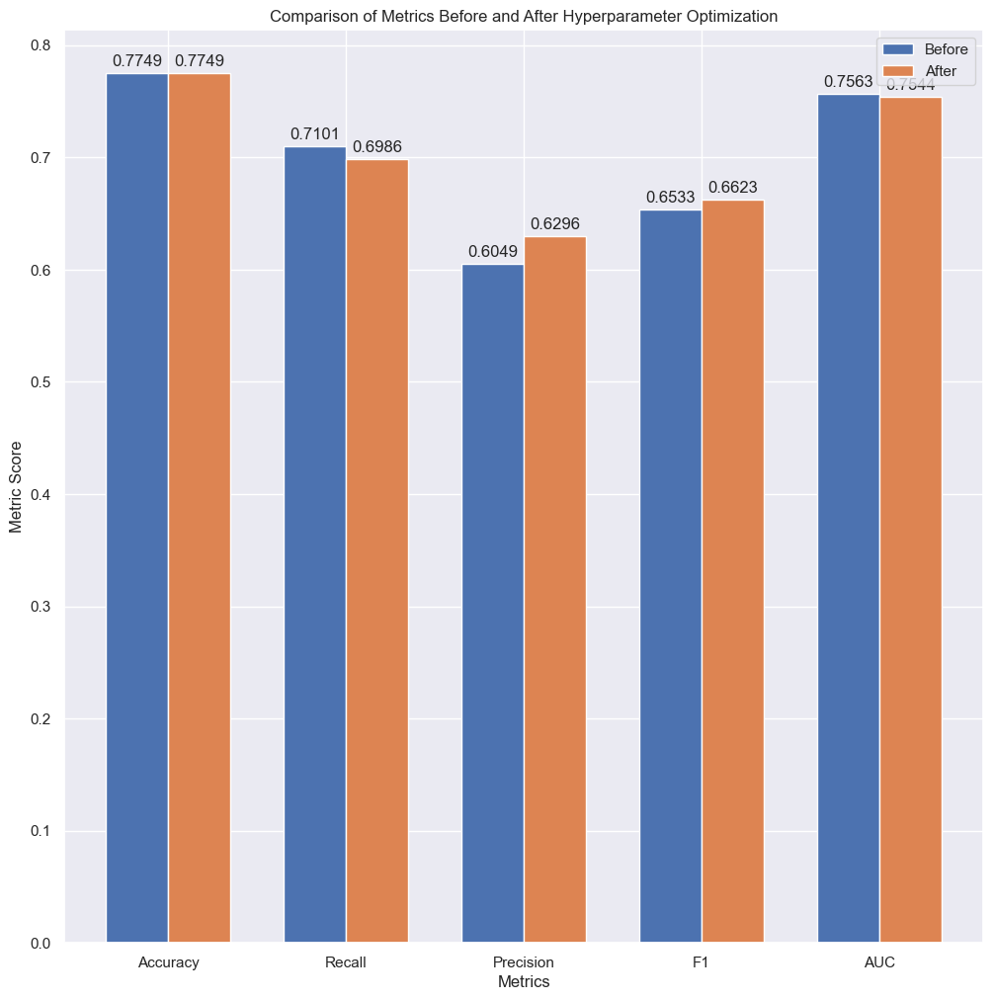

In [121]:
# Metric names
metrics = ["Accuracy", "Recall", "Precision", "F1", "AUC"]

# Metric values before hyperparameter optimization
before_values = [0.7749, 0.7101, 0.6049, 0.6533, 0.7563]

# Metric values after hyperparameter optimization
after_values = [0.7749, 0.6986, 0.6296, 0.6623, 0.7544]

# Index for the x-axis
x = np.arange(len(metrics))

# Width of the bars
width = 0.35

# Creating the figure and axes
fig, ax = plt.subplots()

# Plotting the bars for before values
rects1 = ax.bar(x - width/2, before_values, width, label='Before')

# Plotting the bars for after values
rects2 = ax.bar(x + width/2, after_values, width, label='After')

# Setting labels and title
ax.set_xlabel('Metrics')
ax.set_ylabel('Metric Score')
ax.set_title('Comparison of Metrics Before and After Hyperparameter Optimization')
ax.set_xticks(x)
ax.set_xticklabels(metrics)
ax.legend()

# Function to attach the metric values on top of the bars
def autolabel(rects):
    for rect in rects:
        height = rect.get_height()
        ax.annotate(f'{round(height, 4)}', xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3), textcoords='offset points',
                    ha='center', va='bottom')

# Attaching metric values on top of the bars
autolabel(rects1)
autolabel(rects2)

# Displaying the plot
plt.show()